In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df= pd.read_csv("/content/final_model_data.csv")

In [ ]:
print(len(df))

271500


In [ ]:
df

,year_week,fire_count,fire_label,x_bin,y_bin,longitude,latitude,NDVI,EVI,temp_max,...,date,month,grid_zone,adm2,fire_count_last_4_weeks,fire_occurred_last_week,distance_to_nearest_fire,landcover_class,landcover_class_name,gHM
0,2022-01,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.006022,0.083732,301.228289,...,2022-01-03,1,-52.1_-1.2,7,0,0,0.632456,10,Tree cover,0.058139
1,2022-02,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.147128,0.381171,303.283195,...,2022-01-10,1,-52.1_-1.2,7,0,0,0.447214,10,Tree cover,0.058139
2,2022-03,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.260413,0.409360,303.451469,...,2022-01-17,1,-52.1_-1.2,7,0,0,0.447214,10,Tree cover,0.058139
3,2022-04,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.061701,0.279987,301.782644,...,2022-01-24,1,-52.1_-1.2,7,0,0,0.447214,90,Herbaceous wetlands,0.057704
4,2022-05,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.046812,0.217020,302.499471,...,2022-01-31,1,-52.1_-1.2,7,0,0,0.447214,90,Herbaceous wetlands,0.057704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271495,2024-28,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.905299,0.617197,306.846186,...,2024-07-15,7,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000
271496,2024-29,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.890003,0.555556,307.425341,...,2024-07-22,7,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000
271497,2024-30,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.872591,0.588274,308.310008,...,2024-07-29,7,-58.5_-7.0,60,3,0,0.000000,10,Tree cover,0.000000
271498,2024-31,1.0,1.0,-58.5,-7.0,-58.45,-6.95,0.552773,0.444403,310.587936,...,2024-08-05,8,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000


In [ ]:
df.columns

Index(['year_week', 'fire_count', 'fire_label', 'x_bin', 'y_bin', 'longitude',
       'latitude', 'NDVI', 'EVI', 'temp_max', 'temp_min', 'precipitation',
       'wind_u_10m', 'wind_v_10m', 'frp__MW', 'date', 'month', 'grid_zone',
       'adm2', 'fire_count_last_4_weeks', 'fire_occurred_last_week',
       'distance_to_nearest_fire', 'landcover_class', 'landcover_class_name',
       'gHM'],
      dtype='object')

# **Random Forest**

In [ ]:
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'year', 'grid_zone', 'landcover_class_name', 'fire_label','fire_count','frp__MW','fire_count_last_4_weeks', 'fire_occurred_last_week',"distance_to_nearest_fire"]
feature_cols = [col for col in df.columns if col not in drop_cols]

X = df[feature_cols]
y = df['fire_label']

# --- Split Train (2022–2023) vs Test (2024) ---
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")

# ---Train Random Forest ---
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    min_samples_leaf=3,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)

Train samples: 188207, Test samples: 83293


RandomForestClassifier(class_weight='balanced', max_depth=15,
                       min_samples_leaf=3, min_samples_split=5,
                       n_estimators=300, n_jobs=-1, random_state=42)

In [ ]:
# --- Evaluate Model ---
y_pred1 = rf_model.predict(X_test)
y_proba1 = rf_model.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred1))

print("ROC AUC Score:", roc_auc_score(y_test, y_proba1))


Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.97     73936
         1.0       0.68      0.88      0.76      9357

    accuracy                           0.94     83293
   macro avg       0.83      0.91      0.87     83293
weighted avg       0.95      0.94      0.94     83293

ROC AUC Score: 0.9713859085242554


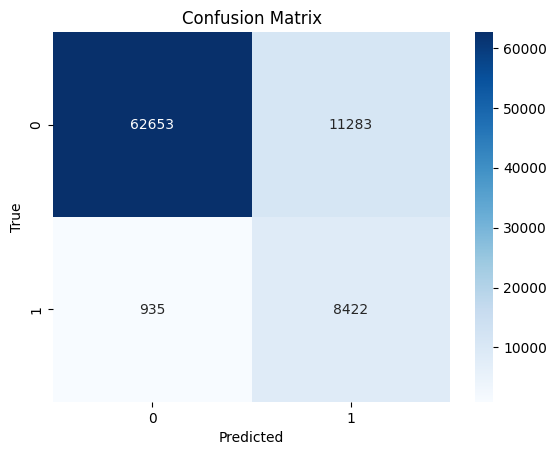

In [ ]:
# --- Confusion Matrix ---
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

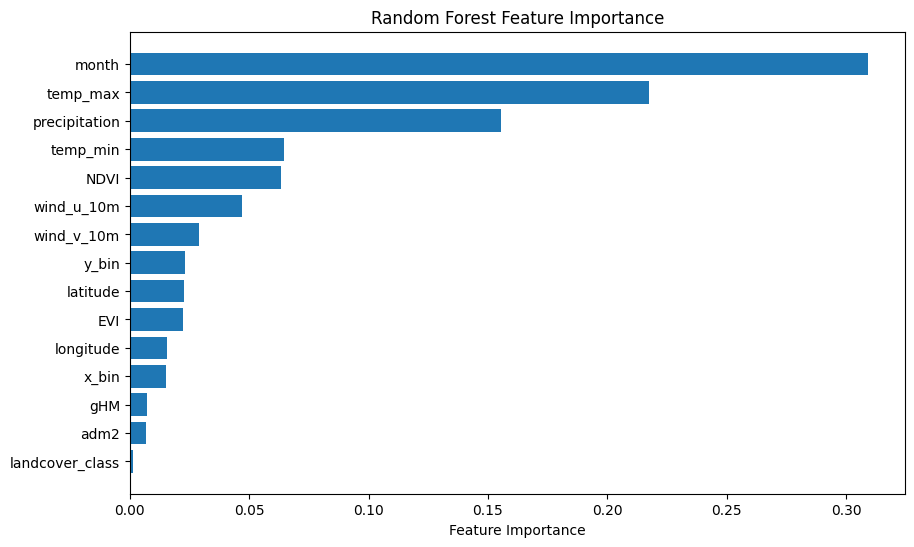

In [ ]:
# --- Feature Importance ---
feature_importance = rf_model.feature_importances_
sorted_idx = feature_importance.argsort()

plt.figure(figsize=(10, 6))
plt.barh(X_train.columns[sorted_idx], feature_importance[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')
plt.show()

In [ ]:
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'year', 'grid_zone', 'landcover_class_name', 'fire_label','fire_count','frp__MW','fire_count_last_4_weeks', 'fire_occurred_last_week',"distance_to_nearest_fire"]
feature_cols = [col for col in df.columns if col not in drop_cols]

X = df[feature_cols]
y = df['fire_label']

# --- Split Train (2022–2023) vs Test (2024) ---
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")

#Tune and train Random Forest
rf_model_tuned = RandomForestClassifier(
    n_estimators=500,               # Increase trees for more stability
    max_depth=20,                   # Allow deeper trees (captures more patterns)
    min_samples_split=10,           # More conservative splits → less overfitting
    min_samples_leaf=4,             # Avoid very small leaves
    max_features='sqrt',            # Common in RF; reduces correlation among trees
    class_weight='balanced',        # Keep this to address class imbalance
    random_state=42,
    n_jobs=-1
)
rf_model_tuned.fit(X_train, y_train)

Train samples: 188207, Test samples: 83293


RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=4, min_samples_split=10,
                       n_estimators=500, n_jobs=-1, random_state=42)

In [ ]:
# --- Evaluate Model ---
y_pred1 = rf_model_tuned.predict(X_test)
y_proba1 =rf_model_tuned.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred1))

print("ROC AUC Score:", roc_auc_score(y_test, y_proba1))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97     73936
         1.0       0.72      0.87      0.79      9357

    accuracy                           0.95     83293
   macro avg       0.85      0.91      0.88     83293
weighted avg       0.95      0.95      0.95     83293

ROC AUC Score: 0.9716218936072472


In [ ]:
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'year','grid_zone', 'landcover_class_name', 'fire_label','fire_count','frp__MW']
feature_cols = [col for col in df.columns if col not in drop_cols]

X = df[feature_cols]
y = df['fire_label']

# --- Split Train (2022–2023) vs Test (2024) ---
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")

# --- 5. Train Random Forest ---
rf_model2 = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    min_samples_leaf=3,
    class_weight='balanced',  # Important for fire prediction (fire = rare event)
    random_state=42,
    n_jobs=-1
)

rf_model2.fit(X_train, y_train)

Train samples: 188207, Test samples: 83293


RandomForestClassifier(class_weight='balanced', max_depth=15,
                       min_samples_leaf=3, min_samples_split=5,
                       n_estimators=300, n_jobs=-1, random_state=42)

In [ ]:
# --- Evaluate Model ---
y_pred = rf_model2.predict(X_test)
y_proba = rf_model2.predict_proba(X_test)[:, 1]  # Probabilities for class 1 (fire)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("ROC AUC Score:", roc_auc_score(y_test, y_proba))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.92      0.95     73936
         1.0       0.58      0.91      0.71      9357

    accuracy                           0.92     83293
   macro avg       0.79      0.92      0.83     83293
weighted avg       0.94      0.92      0.93     83293

ROC AUC Score: 0.9739580012378726


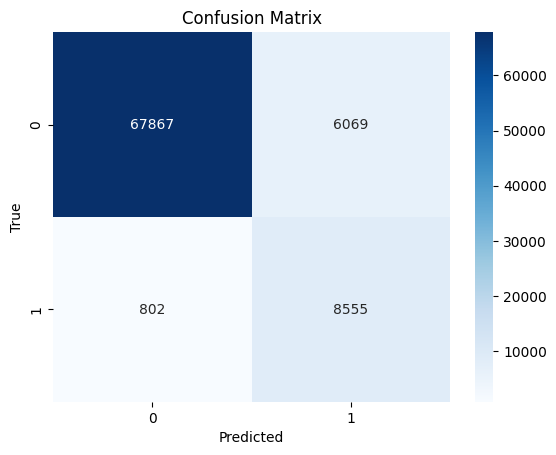

In [ ]:
# --- 7. Confusion Matrix ---
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

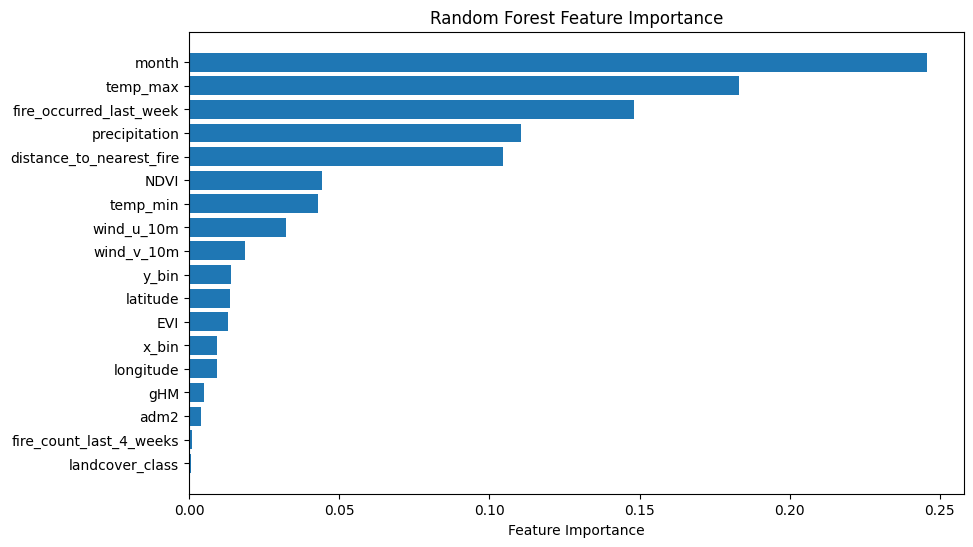

In [ ]:
# --- Feature Importance ---
feature_importance = rf_model2.feature_importances_
sorted_idx = feature_importance.argsort()

plt.figure(figsize=(10, 6))
plt.barh(X_train.columns[sorted_idx], feature_importance[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'year','grid_zone', 'landcover_class_name', 'fire_label','fire_count','frp__MW']
feature_cols = [col for col in df.columns if col not in drop_cols]

X = df[feature_cols]
y = df['fire_label']

# --- Split Train (2022–2023) vs Test (2024) ---
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")

#Tune and train Random Forest
rf_model_tuned = RandomForestClassifier(
    n_estimators=500,               # Increase trees for more stability
    max_depth=20,                   # Allow deeper trees (captures more patterns)
    min_samples_split=10,           # More conservative splits → less overfitting
    min_samples_leaf=4,             # Avoid very small leaves
    max_features='sqrt',            # Common in RF; reduces correlation among trees
    class_weight='balanced',        # Keep this to address class imbalance
    random_state=42,
    n_jobs=-1
)
rf_model_tuned.fit(X_train, y_train)

Train samples: 188207, Test samples: 83293


RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=4, min_samples_split=10,
                       n_estimators=500, n_jobs=-1, random_state=42)

In [ ]:
# --- Evaluate Model ---
y_pred = rf_model_tuned.predict(X_test)
y_proba = rf_model_tuned.predict_proba(X_test)[:, 1]  # Probabilities for class 1 (fire)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("ROC AUC Score:", roc_auc_score(y_test, y_proba))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96     73936
         1.0       0.62      0.91      0.74      9357

    accuracy                           0.93     83293
   macro avg       0.80      0.92      0.85     83293
weighted avg       0.95      0.93      0.93     83293

ROC AUC Score: 0.974027815726038


# **LightGBM Model (Scenario B)**

In [ ]:
from lightgbm import LGBMClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier, early_stopping, log_evaluation
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score
import pandas as pd

In [ ]:
# Drop unused columns
drop_cols = ['year_week', 'date','grid_zone', 'landcover_class_name',
             'fire_label','fire_count','frp__MW','fire_count_last_4_weeks',
             'fire_occurred_last_week', 'distance_to_nearest_fire']

X = df.drop(columns=drop_cols)
y = df['fire_label']


In [ ]:
# Create masks
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

# Apply masks to get actual data
train_data = df[train_mask]
test_data = df[test_mask]

# Now drop and split correctly
X_train1= train_data.drop(columns=drop_cols)
y_train1 = train_data['fire_label']

X_test1= test_data.drop(columns=drop_cols)
y_test1 = test_data['fire_label']


In [ ]:
#Train LightGBM Model

# Instantiate the model
model = LGBMClassifier(n_estimators=1000)

# Fit the model using callbacks for early stopping
model.fit(
    X_train1, y_train1,
    eval_set=[(X_test1, y_test1)],
    eval_metric='auc',
    callbacks=[early_stopping(stopping_rounds=50), log_evaluation(10)]
)

[LightGBM] [Info] Number of positive: 23585, number of negative: 164622
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.126165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 188207, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125314 -> initscore=-1.943041
[LightGBM] [Info] Start training from score -1.943041
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.961627	valid_0's binary_logloss: 0.165977
[20]	valid_0's auc: 0.965137	valid_0's binary_logloss: 0.138567
[30]	valid_0's auc: 0.967484	valid_0's binary_logloss: 0.136464
[40]	valid_0's auc: 0.968478	valid_0's binary_logloss: 0.139791
[50]	valid_0's auc: 0.969161	valid_0's binary_logloss: 0.147612
[60]	valid_0's auc: 0.969784	valid_0's binary_logloss: 0.151735
[70]	valid_0's auc: 0.969806	valid_0's binary_logloss: 0.15

LGBMClassifier(n_estimators=1000)

In [ ]:
# Predict and evaluate
y_pred1 = model.predict(X_test1)
y_proba1 = model.predict_proba(X_test1)[:, 1]

print(classification_report(y_test1, y_pred1))
print("ROC AUC Score:", roc_auc_score(y_test1, y_proba1))

              precision    recall  f1-score   support

         0.0       0.98      0.97      0.97     73936
         1.0       0.79      0.82      0.80      9357

    accuracy                           0.96     83293
   macro avg       0.88      0.90      0.89     83293
weighted avg       0.96      0.96      0.96     83293

ROC AUC Score: 0.9668352972974646


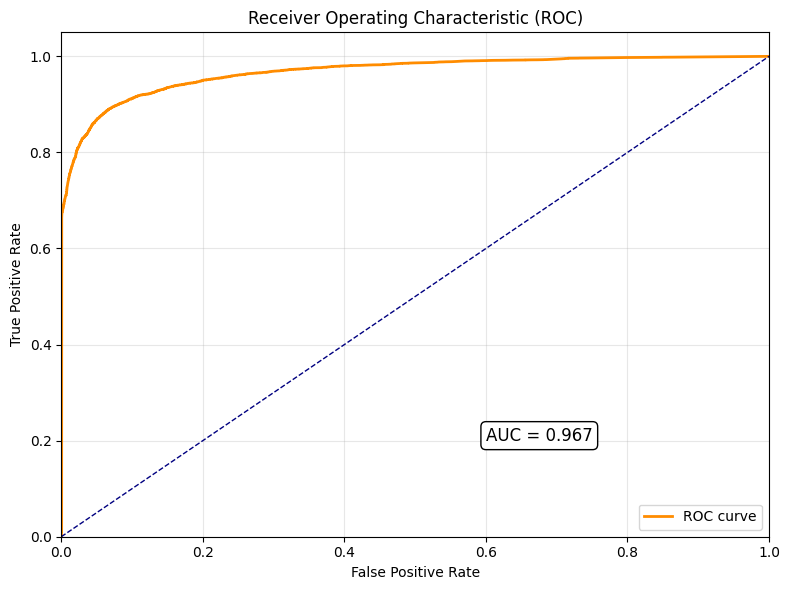

In [ ]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test1, y_proba1)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')  # Diagonal line

# Add AUC value on the plot
plt.text(0.6, 0.2, f'AUC = {roc_auc:.3f}', fontsize=12, color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and formatting
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

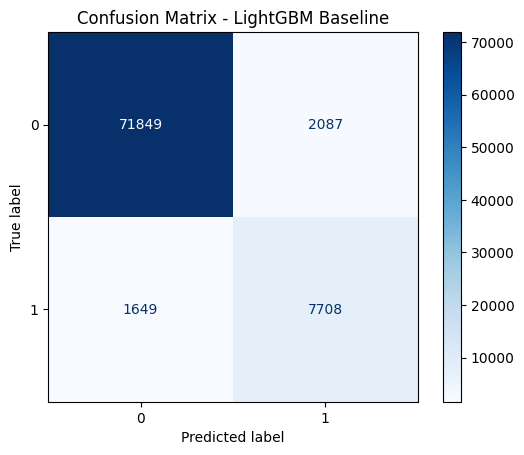

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute confusion matrix
cm = confusion_matrix(y_test1, y_pred1)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - LightGBM Baseline")
plt.show()

In [ ]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_auc_score

# Predictions
y_train_pred = model.predict(X_train1)
y_test_pred = model.predict(X_test1)

# Probabilities for AUC
y_train_prob = model.predict_proba(X_train1)[:, 1]
y_test_prob = model.predict_proba(X_test1)[:, 1]

# Train Metrics
print("\n--- Train Metrics ---")
print("Accuracy :", round(accuracy_score(y_train1, y_train_pred), 4))
print("F1 Score :", round(f1_score(y_train1, y_train_pred), 4))
print("ROC AUC  :", round(roc_auc_score(y_train1, y_train_prob), 4))

# Test Metrics
print("\n--- Test Metrics ---")
print("Accuracy :", round(accuracy_score(y_test1, y_test_pred), 4))
print("F1 Score :", round(f1_score(y_test1, y_test_pred), 4))
print("ROC AUC  :", round(roc_auc_score(y_test1, y_test_prob), 4))


--- Train Metrics ---
Accuracy : 0.9728
F1 Score : 0.8801
ROC AUC  : 0.9805

--- Test Metrics ---
Accuracy : 0.9551
F1 Score : 0.8049
ROC AUC  : 0.9668


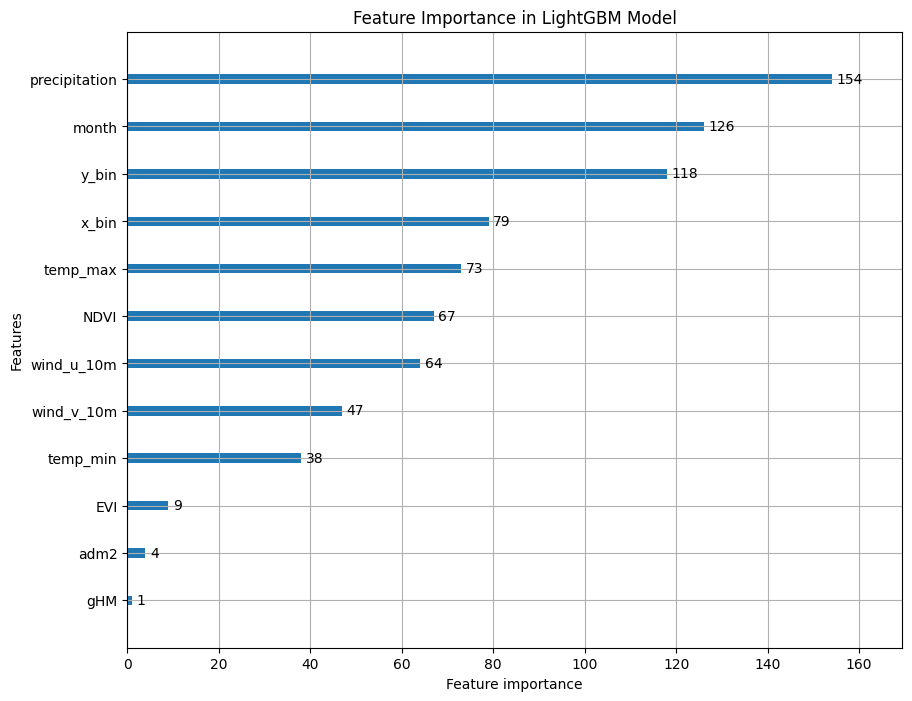

In [ ]:
# Feature importance
lgb.plot_importance(model,
                    importance_type='split',  # Options: 'split' or 'gain'
                    max_num_features=20,  # Adjust number of top features to show
                    figsize=(10, 8),  # Adjust figure size
                    title='Feature Importance in LightGBM Model')
plt.show()


In [ ]:
#Tuning the static LighGbm model
import numpy as np
import optuna
from lightgbm import LGBMClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import TimeSeriesSplit

# Prepare Train(2022–23) vs Test(2024)
drop_cols = [
    'year_week', 'date', 'grid_zone', 'landcover_class_name',
    'fire_label', 'fire_count', 'frp__MW',
    'fire_count_last_4_weeks', 'fire_occurred_last_week',
    'distance_to_nearest_fire'
]

train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

# TimeSeriesSplit on 2022–23
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    params = {
        'n_estimators':      trial.suggest_int('n_estimators', 100, 1200),
        'learning_rate':     trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'num_leaves':        trial.suggest_int('num_leaves', 20, 100),
        'max_depth':         trial.suggest_int('max_depth', -1, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'subsample':         trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree':  trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'random_state':      42,
        'n_jobs':           -1
    }

    f1_scores = []
    for train_idx, val_idx in tscv.split(X_train_full):
        X_tr, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_tr, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        model = LGBMClassifier(**params)
        model.fit(
            X_tr,
            y_tr,
            eval_set=[(X_val, y_val)],
            eval_metric='binary_logloss',
            callbacks=[
                lgb.early_stopping(stopping_rounds=50),
                lgb.log_evaluation(period=0)
            ]
        )

        y_pred = model.predict(X_val)
        f1_scores.append(f1_score(y_val, y_pred))

    return np.mean(f1_scores)

# Run Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=1800)

print(" Best CV F1:", study.best_value)
print(" Best Params:", study.best_params)

# Final model: retrain on all 2022–23 & evaluate on 2024
best_params = study.best_params
Tuned_model_static = LGBMClassifier(**best_params, random_state=42, n_jobs=-1)
Tuned_model_static.fit(X_train_full, y_train_full)


[I 2025-05-09 19:53:23,217] A new study created in memory with name: no-name-e9d190b9-7ff4-4731-a88a-8edced4e0848


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 19:53:42,858] Trial 0 finished with value: 0.8756095747423768 and parameters: {'n_estimators': 1181, 'learning_rate': 0.10144410231217851, 'num_leaves': 60, 'max_depth': 8, 'min_child_samples': 77, 'subsample': 0.9825251140784137, 'colsample_bytree': 0.816556685261111}. Best is trial 0 with value: 0.8756095747423768.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[52]	valid_0's binary_logloss: 0.0657978
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] 

[I 2025-05-09 19:53:55,257] Trial 1 finished with value: 0.8789929298961106 and parameters: {'n_estimators': 1011, 'learning_rate': 0.09606390956733035, 'num_leaves': 65, 'max_depth': 0, 'min_child_samples': 51, 'subsample': 0.9252158773746564, 'colsample_bytree': 0.6389620965220913}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[56]	valid_0's binary_logloss: 0.0647253
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] 

[I 2025-05-09 19:54:07,514] Trial 2 finished with value: 0.8727307945902693 and parameters: {'n_estimators': 1151, 'learning_rate': 0.15137690084649894, 'num_leaves': 29, 'max_depth': 15, 'min_child_samples': 90, 'subsample': 0.8345574558173562, 'colsample_bytree': 0.8016758152183192}. Best is trial 1 with value: 0.8789929298961106.


Early stopping, best iteration is:
[114]	valid_0's binary_logloss: 0.0722431
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[128]	valid_0's binary_logloss: 0.0961402
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [I

[I 2025-05-09 19:54:25,665] Trial 3 finished with value: 0.855923029035505 and parameters: {'n_estimators': 128, 'learning_rate': 0.014623856401873197, 'num_leaves': 43, 'max_depth': 20, 'min_child_samples': 81, 'subsample': 0.6254914710555733, 'colsample_bytree': 0.6646123606690808}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[15]	valid_0's binary_logloss: 0.0667164
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] 

[I 2025-05-09 19:54:33,122] Trial 4 finished with value: 0.8698900759365735 and parameters: {'n_estimators': 214, 'learning_rate': 0.2922057674706743, 'num_leaves': 40, 'max_depth': 17, 'min_child_samples': 50, 'subsample': 0.9789182865604709, 'colsample_bytree': 0.8043956329028579}. Best is trial 1 with value: 0.8789929298961106.


Early stopping, best iteration is:
[23]	valid_0's binary_logloss: 0.0769159
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[I 2025-05-09 19:54:52,482] Trial 5 finished with value: 0.8732989254166871 and parameters: {'n_estimators': 784, 'learning_rate': 0.06042060341461311, 'num_leaves': 91, 'max_depth': 12, 'min_child_samples': 60, 'subsample': 0.7257818967563334, 'colsample_bytree': 0.9469629202190568}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 19:55:21,615] Trial 6 finished with value: 0.8133067438827621 and parameters: {'n_estimators': 708, 'learning_rate': 0.019068758424091264, 'num_leaves': 36, 'max_depth': 1, 'min_child_samples': 54, 'subsample': 0.9532809528365123, 'colsample_bytree': 0.7354351627460722}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 19:55:37,233] Trial 7 finished with value: 0.8754439066465804 and parameters: {'n_estimators': 663, 'learning_rate': 0.1389089137991994, 'num_leaves': 98, 'max_depth': 5, 'min_child_samples': 98, 'subsample': 0.9521075682908932, 'colsample_bytree': 0.6537610873525891}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[249]	valid_0's binary_logloss: 0.0634146
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 

[I 2025-05-09 19:56:03,303] Trial 8 finished with value: 0.87727107820372 and parameters: {'n_estimators': 294, 'learning_rate': 0.030393105009650027, 'num_leaves': 43, 'max_depth': 0, 'min_child_samples': 11, 'subsample': 0.6314158203751875, 'colsample_bytree': 0.7383202740923318}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[92]	valid_0's binary_logloss: 0.0651081
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] 

[I 2025-05-09 19:56:16,557] Trial 9 finished with value: 0.875846519689491 and parameters: {'n_estimators': 1184, 'learning_rate': 0.1039977950689877, 'num_leaves': 30, 'max_depth': 16, 'min_child_samples': 86, 'subsample': 0.8911724831072624, 'colsample_bytree': 0.8306836378304796}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 19:56:41,419] Trial 10 finished with value: 0.873429379490943 and parameters: {'n_estimators': 933, 'learning_rate': 0.059971739840233136, 'num_leaves': 74, 'max_depth': 5, 'min_child_samples': 24, 'subsample': 0.7707070963788312, 'colsample_bytree': 0.979716984431604}. Best is trial 1 with value: 0.8789929298961106.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[235]	valid_0's binary_logloss: 0.0652069
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 19:57:15,335] Trial 11 finished with value: 0.8791886007162987 and parameters: {'n_estimators': 389, 'learning_rate': 0.028445209933044755, 'num_leaves': 58, 'max_depth': 0, 'min_child_samples': 12, 'subsample': 0.6028737404556112, 'colsample_bytree': 0.6162902474391369}. Best is trial 11 with value: 0.8791886007162987.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[180]	valid_0's binary_logloss: 0.0642966
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 19:57:44,539] Trial 12 finished with value: 0.8794550971945961 and parameters: {'n_estimators': 399, 'learning_rate': 0.036278191812765835, 'num_leaves': 62, 'max_depth': -1, 'min_child_samples': 35, 'subsample': 0.7206479443624852, 'colsample_bytree': 0.6119775203485348}. Best is trial 12 with value: 0.8794550971945961.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 19:58:10,575] Trial 13 finished with value: 0.8654904890714604 and parameters: {'n_estimators': 430, 'learning_rate': 0.028066843458971796, 'num_leaves': 58, 'max_depth': 4, 'min_child_samples': 32, 'subsample': 0.6952047998861532, 'colsample_bytree': 0.6043968823786808}. Best is trial 12 with value: 0.8794550971945961.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[157]	valid_0's binary_logloss: 0.06371
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] [

[I 2025-05-09 19:58:51,181] Trial 14 finished with value: 0.879706852290634 and parameters: {'n_estimators': 485, 'learning_rate': 0.03384599149646421, 'num_leaves': 79, 'max_depth': -1, 'min_child_samples': 10, 'subsample': 0.6890044702614077, 'colsample_bytree': 0.7150675278720813}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 19:59:22,879] Trial 15 finished with value: 0.8409775043344048 and parameters: {'n_estimators': 498, 'learning_rate': 0.010559358900412987, 'num_leaves': 81, 'max_depth': 3, 'min_child_samples': 33, 'subsample': 0.6916251466949912, 'colsample_bytree': 0.7184214141216901}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 19:59:50,108] Trial 16 finished with value: 0.8766850881855067 and parameters: {'n_estimators': 520, 'learning_rate': 0.045553459336533035, 'num_leaves': 77, 'max_depth': 8, 'min_child_samples': 24, 'subsample': 0.790790489934184, 'colsample_bytree': 0.8981416192057159}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:00:21,826] Trial 17 finished with value: 0.8785633698130921 and parameters: {'n_estimators': 339, 'learning_rate': 0.03788364620173884, 'num_leaves': 86, 'max_depth': 11, 'min_child_samples': 36, 'subsample': 0.7291692765744409, 'colsample_bytree': 0.6966703220083498}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:00:50,445] Trial 18 finished with value: 0.8439689535693233 and parameters: {'n_estimators': 575, 'learning_rate': 0.0203603045225915, 'num_leaves': 69, 'max_depth': 2, 'min_child_samples': 42, 'subsample': 0.6679886870579104, 'colsample_bytree': 0.6816769593208986}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[88]	valid_0's binary_logloss: 0.0645227
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM] 

[I 2025-05-09 20:01:06,837] Trial 19 finished with value: 0.8767556741905075 and parameters: {'n_estimators': 800, 'learning_rate': 0.07174581344104292, 'num_leaves': 50, 'max_depth': -1, 'min_child_samples': 70, 'subsample': 0.8289565686148143, 'colsample_bytree': 0.765654126321328}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 20:01:32,309] Trial 20 finished with value: 0.8736308096857677 and parameters: {'n_estimators': 237, 'learning_rate': 0.03845649009279188, 'num_leaves': 100, 'max_depth': 7, 'min_child_samples': 18, 'subsample': 0.743218790157037, 'colsample_bytree': 0.8642042804211524}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[355]	valid_0's binary_logloss: 0.0647273
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:02:09,984] Trial 21 finished with value: 0.8773987415606417 and parameters: {'n_estimators': 436, 'learning_rate': 0.023993948596405565, 'num_leaves': 52, 'max_depth': -1, 'min_child_samples': 10, 'subsample': 0.6095061722596785, 'colsample_bytree': 0.6129160482257687}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:02:31,398] Trial 22 finished with value: 0.8277524581537493 and parameters: {'n_estimators': 378, 'learning_rate': 0.01579520035070756, 'num_leaves': 67, 'max_depth': 2, 'min_child_samples': 20, 'subsample': 0.6577511451754878, 'colsample_bytree': 0.6296365976576591}. Best is trial 14 with value: 0.879706852290634.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[208]	valid_0's binary_logloss: 0.0647572
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:03:06,121] Trial 23 finished with value: 0.8802265424025062 and parameters: {'n_estimators': 580, 'learning_rate': 0.033056055126440026, 'num_leaves': 56, 'max_depth': -1, 'min_child_samples': 16, 'subsample': 0.6869003126767425, 'colsample_bytree': 0.6012194515276265}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:03:36,200] Trial 24 finished with value: 0.8677599230394899 and parameters: {'n_estimators': 586, 'learning_rate': 0.044808022347035396, 'num_leaves': 53, 'max_depth': 3, 'min_child_samples': 28, 'subsample': 0.7060242124590353, 'colsample_bytree': 0.6929829398284335}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:04:16,891] Trial 25 finished with value: 0.877446407037521 and parameters: {'n_estimators': 505, 'learning_rate': 0.03209336114842091, 'num_leaves': 73, 'max_depth': 6, 'min_child_samples': 41, 'subsample': 0.7611745325746807, 'colsample_bytree': 0.6594292390136395}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[119]	valid_0's binary_logloss: 0.0638563
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:04:40,428] Trial 26 finished with value: 0.8783360304876089 and parameters: {'n_estimators': 718, 'learning_rate': 0.045457853341506496, 'num_leaves': 81, 'max_depth': -1, 'min_child_samples': 18, 'subsample': 0.6666807715664516, 'colsample_bytree': 0.7662438369891583}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:05:09,103] Trial 27 finished with value: 0.833511669260659 and parameters: {'n_estimators': 590, 'learning_rate': 0.012276382755839315, 'num_leaves': 89, 'max_depth': 2, 'min_child_samples': 40, 'subsample': 0.8098520644818171, 'colsample_bytree': 0.7630959954598209}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:05:16,063] Trial 28 finished with value: 0.7720038333078436 and parameters: {'n_estimators': 112, 'learning_rate': 0.02375178796714842, 'num_leaves': 22, 'max_depth': 1, 'min_child_samples': 17, 'subsample': 0.6528299522047102, 'colsample_bytree': 0.6014097475854456}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[112]	valid_0's binary_logloss: 0.127631
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Star

[I 2025-05-09 20:05:33,438] Trial 29 finished with value: 0.872077705843215 and parameters: {'n_estimators': 285, 'learning_rate': 0.09181078350674206, 'num_leaves': 62, 'max_depth': 4, 'min_child_samples': 26, 'subsample': 0.7099399721906273, 'colsample_bytree': 0.7016982516316168}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:05:52,884] Trial 30 finished with value: 0.8768427255027683 and parameters: {'n_estimators': 833, 'learning_rate': 0.07350584121310919, 'num_leaves': 48, 'max_depth': 10, 'min_child_samples': 62, 'subsample': 0.755691244042924, 'colsample_bytree': 0.6444321216352006}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[240]	valid_0's binary_logloss: 0.0650773
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:06:23,889] Trial 31 finished with value: 0.8797434085597615 and parameters: {'n_estimators': 411, 'learning_rate': 0.03298804841281514, 'num_leaves': 57, 'max_depth': 0, 'min_child_samples': 12, 'subsample': 0.6308584282011084, 'colsample_bytree': 0.6256735032247839}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[165]	valid_0's binary_logloss: 0.0650358
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:06:53,239] Trial 32 finished with value: 0.879713530760791 and parameters: {'n_estimators': 451, 'learning_rate': 0.037267461897647555, 'num_leaves': 62, 'max_depth': -1, 'min_child_samples': 14, 'subsample': 0.6809470265188113, 'colsample_bytree': 0.6299420888165885}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:07:14,659] Trial 33 finished with value: 0.8286385119024796 and parameters: {'n_estimators': 479, 'learning_rate': 0.050509145612966315, 'num_leaves': 56, 'max_depth': 1, 'min_child_samples': 14, 'subsample': 0.6816421092761613, 'colsample_bytree': 0.6747737631373547}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[273]	valid_0's binary_logloss: 0.0648104
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:08:00,238] Trial 34 finished with value: 0.8791886332729145 and parameters: {'n_estimators': 612, 'learning_rate': 0.02310660579452913, 'num_leaves': 70, 'max_depth': 0, 'min_child_samples': 21, 'subsample': 0.6349107422012575, 'colsample_bytree': 0.638298480697129}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:08:21,869] Trial 35 finished with value: 0.8236301159887788 and parameters: {'n_estimators': 545, 'learning_rate': 0.03700079741429387, 'num_leaves': 64, 'max_depth': 1, 'min_child_samples': 10, 'subsample': 0.8733252517933096, 'colsample_bytree': 0.636795575295802}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[208]	valid_0's binary_logloss: 0.0716662
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number o

[I 2025-05-09 20:08:41,174] Trial 36 finished with value: 0.8683972773981765 and parameters: {'n_estimators': 208, 'learning_rate': 0.016146212413949538, 'num_leaves': 43, 'max_depth': 14, 'min_child_samples': 28, 'subsample': 0.6384465517760367, 'colsample_bytree': 0.6659138329257425}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:08:51,929] Trial 37 finished with value: 0.8680710055870385 and parameters: {'n_estimators': 459, 'learning_rate': 0.26363557778058017, 'num_leaves': 47, 'max_depth': 3, 'min_child_samples': 15, 'subsample': 0.6773328919103999, 'colsample_bytree': 0.7095185522882194}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[140]	valid_0's binary_logloss: 0.0736531
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[369]	valid_0's binary_logloss: 0.

[I 2025-05-09 20:09:46,992] Trial 38 finished with value: 0.8773032916157218 and parameters: {'n_estimators': 709, 'learning_rate': 0.0190676635293806, 'num_leaves': 55, 'max_depth': 19, 'min_child_samples': 47, 'subsample': 0.6159386659035643, 'colsample_bytree': 0.7363200666761647}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[152]	valid_0's binary_logloss: 0.0636094
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:10:08,203] Trial 39 finished with value: 0.8779376850770421 and parameters: {'n_estimators': 323, 'learning_rate': 0.05306550307103998, 'num_leaves': 38, 'max_depth': 0, 'min_child_samples': 22, 'subsample': 0.7375713589684799, 'colsample_bytree': 0.6303116949942484}. Best is trial 23 with value: 0.8802265424025062.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[212]	valid_0's binary_logloss: 0.0647587
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:10:48,193] Trial 40 finished with value: 0.8804248933841812 and parameters: {'n_estimators': 655, 'learning_rate': 0.026065620685164118, 'num_leaves': 94, 'max_depth': -1, 'min_child_samples': 29, 'subsample': 0.6395945066829071, 'colsample_bytree': 0.6564964686440078}. Best is trial 40 with value: 0.8804248933841812.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[213]	valid_0's binary_logloss: 0.0650244
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points

[I 2025-05-09 20:11:27,622] Trial 41 finished with value: 0.8804190013317944 and parameters: {'n_estimators': 639, 'learning_rate': 0.02597240280076477, 'num_leaves': 97, 'max_depth': -1, 'min_child_samples': 15, 'subsample': 0.6440638001635391, 'colsample_bytree': 0.6600807688438828}. Best is trial 40 with value: 0.8804248933841812.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:11:54,586] Trial 42 finished with value: 0.8217860999337514 and parameters: {'n_estimators': 641, 'learning_rate': 0.028686016527483316, 'num_leaves': 95, 'max_depth': 1, 'min_child_samples': 16, 'subsample': 0.6419614266342669, 'colsample_bytree': 0.6506081492451875}. Best is trial 40 with value: 0.8804248933841812.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[209]	valid_0's binary_logloss: 0.0652381
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:12:34,491] Trial 43 finished with value: 0.8806188789448655 and parameters: {'n_estimators': 869, 'learning_rate': 0.026306270335740976, 'num_leaves': 95, 'max_depth': 0, 'min_child_samples': 30, 'subsample': 0.6247727223503755, 'colsample_bytree': 0.6755276329671187}. Best is trial 43 with value: 0.8806188789448655.


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-05-09 20:13:29,324] Trial 44 finished with value: 0.8563396594300328 and parameters: {'n_estimators': 1081, 'learning_rate': 0.020709958011478933, 'num_leaves': 96, 'max_depth': 2, 'min_child_samples': 29, 'subsample': 0.6263833623845211, 'colsample_bytree': 0.6783557185573661}. Best is trial 43 with value: 0.8806188789448655.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[223]	valid_0's binary_logloss: 0.0646328
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:14:09,093] Trial 45 finished with value: 0.8802281667300754 and parameters: {'n_estimators': 955, 'learning_rate': 0.025524287058394622, 'num_leaves': 93, 'max_depth': 0, 'min_child_samples': 23, 'subsample': 0.6140094412075887, 'colsample_bytree': 0.6609061926241792}. Best is trial 43 with value: 0.8806188789448655.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:15:10,357] Trial 46 finished with value: 0.8732291814671796 and parameters: {'n_estimators': 959, 'learning_rate': 0.026228092490453343, 'num_leaves': 92, 'max_depth': 4, 'min_child_samples': 45, 'subsample': 0.6075122458087195, 'colsample_bytree': 0.6580988862545295}. Best is trial 43 with value: 0.8806188789448655.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:15:57,013] Trial 47 finished with value: 0.8152500735511101 and parameters: {'n_estimators': 930, 'learning_rate': 0.015949365020364058, 'num_leaves': 85, 'max_depth': 1, 'min_child_samples': 37, 'subsample': 0.6487192026640702, 'colsample_bytree': 0.7900532334798017}. Best is trial 43 with value: 0.8806188789448655.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[303]	valid_0's binary_logloss: 0.0647252
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2312
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 15
[LightGBM]

[I 2025-05-09 20:16:54,016] Trial 48 finished with value: 0.8803515061545646 and parameters: {'n_estimators': 860, 'learning_rate': 0.01812039929321125, 'num_leaves': 94, 'max_depth': 0, 'min_child_samples': 30, 'subsample': 0.600132034073533, 'colsample_bytree': 0.685565554006368}. Best is trial 43 with value: 0.8806188789448655.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2268
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 20:18:12,883] Trial 49 finished with value: 0.870319498150945 and parameters: {'n_estimators': 871, 'learning_rate': 0.012903265928160153, 'num_leaves': 94, 'max_depth': 5, 'min_child_samples': 32, 'subsample': 0.6012361040675666, 'colsample_bytree': 0.7235156386379671}. Best is trial 43 with value: 0.8806188789448655.


 Best CV F1: 0.8806188789448655
 Best Params: {'n_estimators': 869, 'learning_rate': 0.026306270335740976, 'num_leaves': 95, 'max_depth': 0, 'min_child_samples': 30, 'subsample': 0.6247727223503755, 'colsample_bytree': 0.6755276329671187}
[LightGBM] [Info] Number of positive: 23585, number of negative: 164622
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 188207, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125314 -> initscore=-1.943041
[LightGBM] [Info] Start training from score -1.943041


LGBMClassifier(colsample_bytree=0.6755276329671187,
               learning_rate=0.026306270335740976, max_depth=0,
               min_child_samples=30, n_estimators=869, n_jobs=-1, num_leaves=95,
               random_state=42, subsample=0.6247727223503755)

In [ ]:
from sklearn.metrics import precision_recall_curve, classification_report, roc_auc_score

# Get predicted probabilities on 2024 hold-out
probs = Tuned_model_static.predict_proba(X_test)[:, 1]

# Compute precision-recall curve
precisions, recalls, thresholds = precision_recall_curve(y_test, probs)

# Inspect a few candidate thresholds
candidates = []
for p, r, t in zip(precisions, recalls, np.append(thresholds, 1.0)):
    if r >= 0.85:  # e.g. require at least 85% recall
        candidates.append((t, p, r))
# sort by precision descending
candidates = sorted(candidates, key=lambda x: x[1], reverse=True)
print("Top candidates (threshold, precision, recall):")
print(candidates[:5])

# Choose a threshold
best_thresh = candidates[0][0]

# Apply new threshold and evaluate
y_pred_adj = (probs >= best_thresh).astype(int)

print(f"\nUsing threshold = {best_thresh:.3f}\n")
print(classification_report(y_test, y_pred_adj))
print("ROC AUC (unchanged):", roc_auc_score(y_test, probs))

Top candidates (threshold, precision, recall):
[(np.float64(0.7647730439829488), np.float64(0.749105292898851), np.float64(0.8500587795233515)), (np.float64(0.7647540138881392), np.float64(0.749034749034749), np.float64(0.8500587795233515)), (np.float64(0.7647448218135801), np.float64(0.7489642184557439), np.float64(0.8500587795233515)), (np.float64(0.7644970352470332), np.float64(0.7488231971380155), np.float64(0.8500587795233515)), (np.float64(0.7644171971806473), np.float64(0.7487527063917914), np.float64(0.8500587795233515))]

Using threshold = 0.765

              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97     73936
         1.0       0.75      0.85      0.80      9357

    accuracy                           0.95     83293
   macro avg       0.86      0.91      0.88     83293
weighted avg       0.95      0.95      0.95     83293

ROC AUC (unchanged): 0.9720253025027558


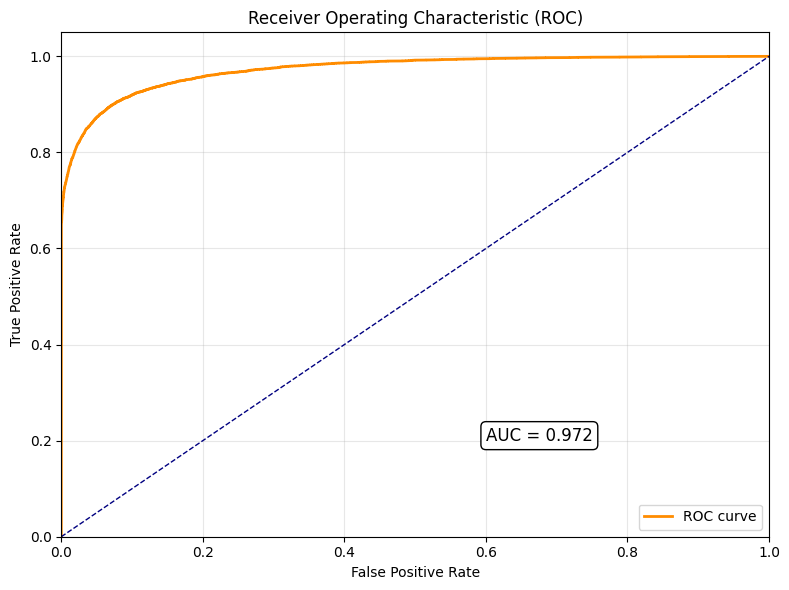

In [ ]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')  # Diagonal line

# Add AUC value on the plot
plt.text(0.6, 0.2, f'AUC = {roc_auc:.3f}', fontsize=12, color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and formatting
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

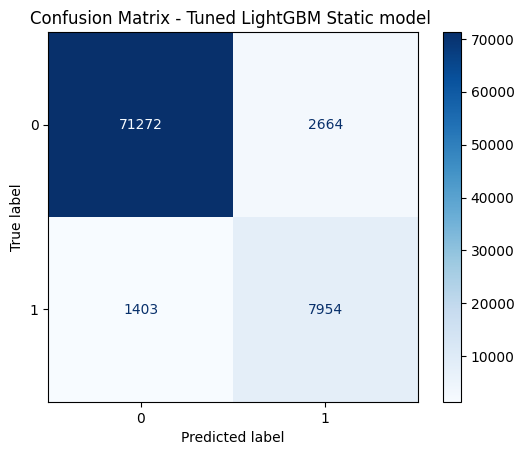

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_adj)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Tuned LightGBM Static model ")
plt.show()

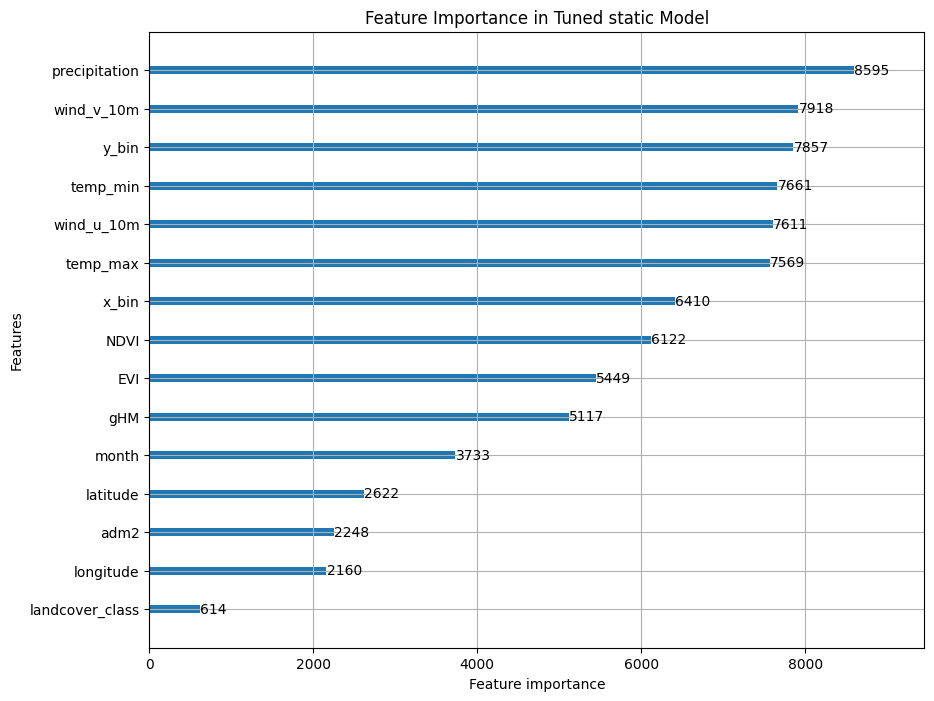

In [ ]:
# Assuming 'model' is your trained LightGBM model
lgb.plot_importance(Tuned_model_static,
                    importance_type='gain',
                    max_num_features=20,  # Adjust number of top features to show
                    figsize=(10, 8),  # Adjust figure size
                    title='Feature Importance in Tuned static Model')
plt.show()

In [ ]:
#save the model

import joblib

# save `Tuned_model_static`
joblib.dump(Tuned_model_static, 'lightgbm_static_model_tuned.pkl')


['lightgbm_static_model_tuned.pkl']

**probability calibration**

In [ ]:
#import the tuned XGboost
import joblib

# Load the model
model = joblib.load("/content/lightgbm_static_model_tuned_uncal.pkl")

In [ ]:
drop_cols = [
    'year_week', 'date', 'grid_zone', 'landcover_class_name',
    'fire_label', 'fire_count', 'frp__MW',
    'fire_count_last_4_weeks', 'fire_occurred_last_week',
    'distance_to_nearest_fire'
]

train_mask = df['year_week'].str.startswith(('2022','2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

In [ ]:
y_probs = model.predict_proba(X_test)[:, 1]

In [ ]:
from sklearn.model_selection import train_test_split

# X and y should be your full test set features and labels
X_calib, X_eval, y_calib, y_eval = train_test_split(X_test, y_test, test_size=0.5, random_state=42, stratify=y_test)

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

# Calibrate on a held-out set using the already trained model
calibrated_model = CalibratedClassifierCV(estimator=model, method='sigmoid', cv='prefit')
calibrated_model.fit(X_calib, y_calib)

/usr/local/lib/python3.11/dist-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


CalibratedClassifierCV(cv='prefit',
                       estimator=LGBMClassifier(colsample_bytree=0.6755276329671187,
                                                learning_rate=0.026306270335740976,
                                                max_depth=0,
                                                min_child_samples=30,
                                                n_estimators=869, n_jobs=-1,
                                                num_leaves=95, random_state=42,
                                                subsample=0.6247727223503755))

In [ ]:
from sklearn.calibration import calibration_curve

# Get uncalibrated and calibrated probabilities
y_probs_uncal = y_probs              # This is your model's original (uncalibrated) output
y_probs_cal = calibrated_model.predict_proba(X_test)[:, 1]

# Compute calibration curves
prob_true_uncal, prob_pred_uncal = calibration_curve(y_test, y_probs_uncal, n_bins=10)
prob_true_cal, prob_pred_cal = calibration_curve(y_test, y_probs_cal, n_bins=10)

# Plot both
plt.figure(figsize=(6, 6))
plt.plot(prob_pred_uncal, prob_true_uncal, marker='o', label='Uncalibrated Model')
plt.plot(prob_pred_cal, prob_true_cal, marker='s', label='Calibrated Model')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')

# Formatting
plt.xlabel('Predicted Probability')
plt.ylabel('True Proportion of Positives')
plt.title('Sigmoid Calibration Curve: Calibrated vs. Uncalibrated')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# **LightGBM with Fire history Features (Scenario A)**

In [ ]:
# Drop unused columns (we include fire_history features)
drop_cols = ['year_week', 'date','grid_zone', 'landcover_class_name',
             'fire_label','fire_count','frp__MW']


X = df.drop(columns=drop_cols)
y = df['fire_label']

# Create masks
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

# Apply masks to get actual data
train_data = df[train_mask]
test_data = df[test_mask]

# Now drop and split correctly
X_train2 = train_data.drop(columns=drop_cols)
y_train2 = train_data['fire_label']

X_test2 = test_data.drop(columns=drop_cols)
y_test2 = test_data['fire_label']



In [ ]:
#Train LightGBM Model 2

# Instantiate the model
model2 = LGBMClassifier(n_estimators=1000)

# Fit the model using callbacks for early stopping
model2.fit(
    X_train2, y_train2,
    eval_set=[(X_test2, y_test2)],
    eval_metric='auc',
    callbacks=[early_stopping(stopping_rounds=50), log_evaluation(10)]
)

[LightGBM] [Info] Number of positive: 23585, number of negative: 164622
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2726
[LightGBM] [Info] Number of data points in the train set: 188207, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125314 -> initscore=-1.943041
[LightGBM] [Info] Start training from score -1.943041
Training until validation scores don't improve for 50 rounds
[10]	valid_0's auc: 0.967032	valid_0's binary_logloss: 0.176895
[20]	valid_0's auc: 0.96856	valid_0's binary_logloss: 0.160626
[30]	valid_0's auc: 0.970034	valid_0's binary_logloss: 0.159361
[40]	valid_0's auc: 0.970802	valid_0's binary_logloss: 0.167747
[50]	valid_0's auc: 0.971802	valid_0's binary_logloss: 0.170644
[60]	valid_0's auc: 0.971838	valid_0's binary_logloss: 0.179

LGBMClassifier(n_estimators=1000)

In [ ]:
# evaluate the model with classification_report and roc_auc_score
y_pred2 = model2.predict(X_test2)
y_prob2 = model2.predict_proba(X_test2)[:, 1]

print(classification_report(y_test2, y_pred2))
print(f"ROC AUC Score: {roc_auc_score(y_test2, y_prob2)}")


              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96     73936
         1.0       0.67      0.87      0.76      9357

    accuracy                           0.94     83293
   macro avg       0.83      0.91      0.86     83293
weighted avg       0.95      0.94      0.94     83293

ROC AUC Score: 0.9699842669287652


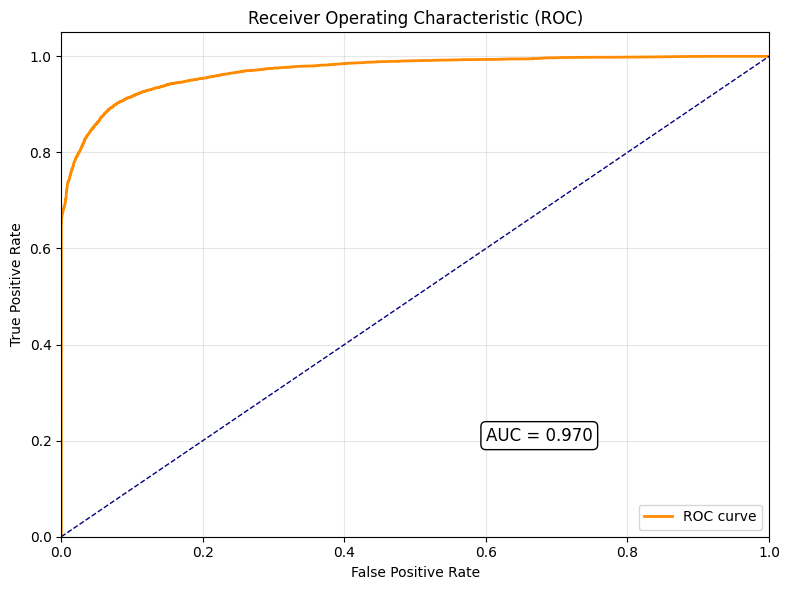

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities
y_prob2 = model2.predict_proba(X_test2)[:, 1]

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test2, y_prob2)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')  # Diagonal line

# Add AUC value on the plot
plt.text(0.6, 0.2, f'AUC = {roc_auc:.3f}', fontsize=12, color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and formatting
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

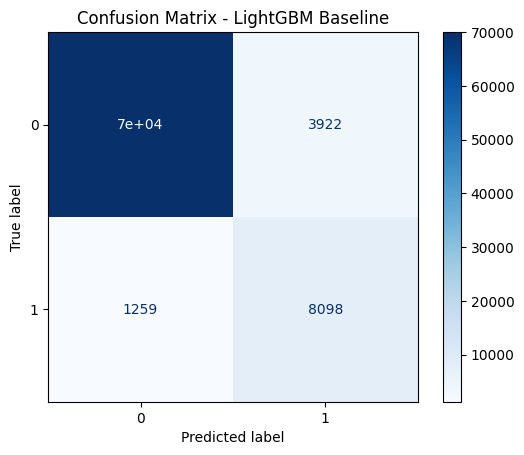

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute confusion matrix
cm = confusion_matrix(y_test2, y_pred2)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - LightGBM with Fire History Features")
plt.show()

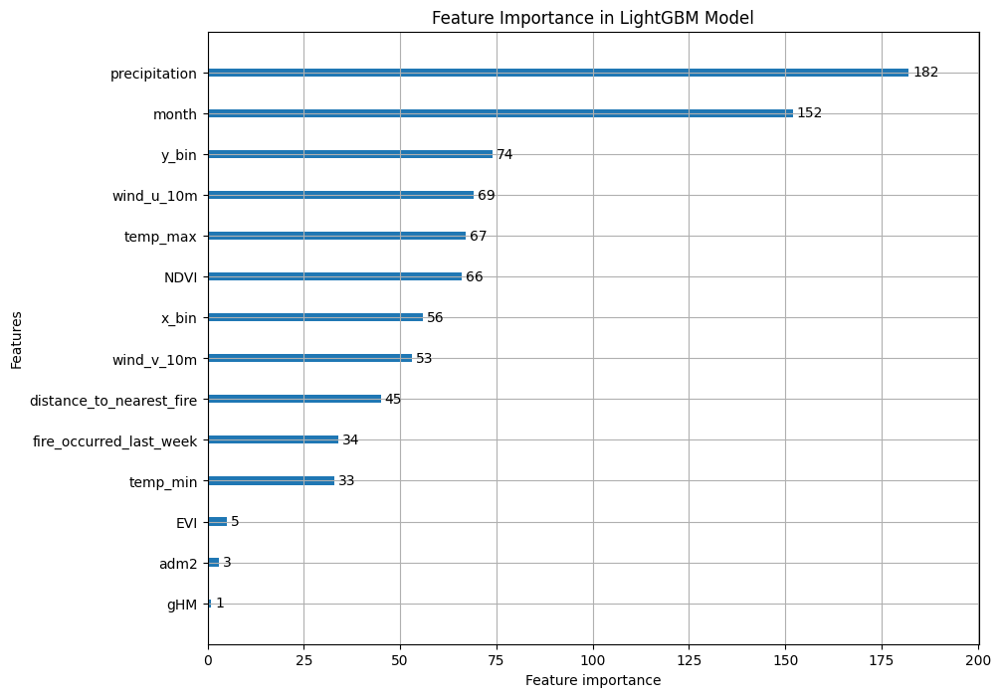

In [ ]:
lgb.plot_importance(model2,
                    importance_type='split',  # Options: 'split' or 'gain'
                    max_num_features=20,  # Adjust number of top features to show
                    figsize=(10, 8),  # Adjust figure size
                    title='Feature Importance in LightGBM Model')
plt.show()


In [ ]:
#Hyperparameter tuning with RandomizedSearchCV
from lightgbm import LGBMClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define parameters (reduced for efficiency)
params = {
    'num_leaves': [31, 50, 70],
    'max_depth': [-1, 10, 20],
    'learning_rate': [0.05, 0.1, 0.2],  # 0.2 for faster learning (early stopping helps)
    'n_estimators': [500, 1000, 1500],  # Extend upper range
    'min_child_samples': [20, 50, 100],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Prepare features and labels
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name',
             'fire_label', 'fire_count', 'frp__MW']

# Train-test split based on your year filtering
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

train_data = df[train_mask]
test_data = df[test_mask]

X_train_best = train_data.drop(columns=drop_cols)
y_train_best = train_data['fire_label']

X_test_best = test_data.drop(columns=drop_cols)
y_test_best = test_data['fire_label']

# Initialize model and run tuning
lgbm = LGBMClassifier(random_state=42)

random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=params,
    n_iter=30,  # fewer iterations to save time
    scoring='roc_auc',
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# Fit model on correct training set
random_search.fit(X_train_best, y_train_best)
# Best model
best_model = random_search.best_estimator_


Fitting 3 folds for each of 30 candidates, totalling 90 fits
[LightGBM] [Info] Number of positive: 23585, number of negative: 164622
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2726
[LightGBM] [Info] Number of data points in the train set: 188207, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125314 -> initscore=-1.943041
[LightGBM] [Info] Start training from score -1.943041


In [ ]:
print(random_search.best_params_)

{'subsample': 0.8, 'num_leaves': 70, 'n_estimators': 1000, 'min_child_samples': 100, 'max_depth': 20, 'learning_rate': 0.2, 'colsample_bytree': 0.8}


In [ ]:
# Predict class labels and probabilities
y_pred_best = best_model.predict(X_test_best)
y_proba_best = best_model.predict_proba(X_test_best)[:, 1]

# Print classification report
print("Classification Report:")
print(classification_report(y_test_best, y_pred_best))

# Print ROC AUC
print("ROC AUC Score:", roc_auc_score(y_test_best, y_proba_best))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     73936
         1.0       0.50      0.92      0.65      9357

    accuracy                           0.89     83293
   macro avg       0.75      0.90      0.79     83293
weighted avg       0.93      0.89      0.90     83293

ROC AUC Score: 0.9683263170199139


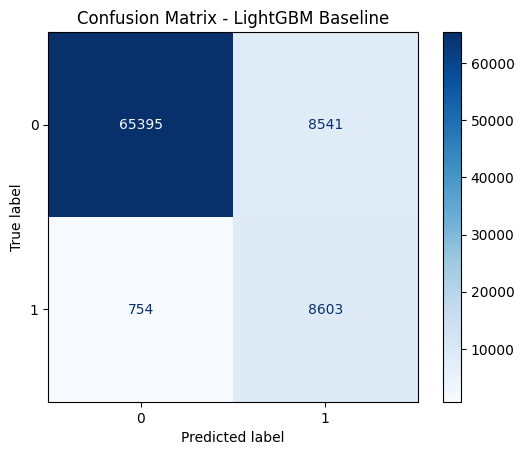

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test_best, y_pred_best)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - LightGBM Baseline")
plt.show()

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 14.9 MB/s eta 0:00:00


In [ ]:
#Tuning LightGBM model with Firehistory features
import numpy as np
import optuna
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.metrics import f1_score, roc_auc_score, classification_report
from sklearn.model_selection import TimeSeriesSplit

# 1) Define columns to drop and split your data
drop_cols = [
    'year_week', 'date', 'grid_zone', 'landcover_class_name',
    'fire_label', 'fire_count', 'frp__MW'
]

train_mask = df['year_week'].str.startswith(('2022','2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

# 2) Set up TimeSeriesSplit on 2022–23
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    # 3) Search space
    params = {
        'n_estimators':      trial.suggest_int('n_estimators', 100, 1200),
        'learning_rate':     trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'num_leaves':        trial.suggest_int('num_leaves', 20, 100),
        'max_depth':         trial.suggest_int('max_depth', -1, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'subsample':         trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree':  trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'random_state':      42,
        'n_jobs':            -1
    }

    f1_scores = []
    # 4) Rolling-window CV
    for train_idx, val_idx in tscv.split(X_train_full):
        X_tr, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_tr, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        model = LGBMClassifier(**params)
        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            eval_metric='binary_logloss',
            callbacks=[
                lgb.early_stopping(stopping_rounds=50),
                lgb.log_evaluation(period=0)
            ]
        )

        preds = model.predict(X_val)
        f1_scores.append(f1_score(y_val, preds))

    return np.mean(f1_scores)

# 5) Run Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=1800)

print("Best CV F1:", study.best_value)
print("Best Params:", study.best_params)

# 6) Retrain on all 2022–23 and evaluate on 2024
best_params = study.best_params
final_model = LGBMClassifier(**best_params, random_state=42, n_jobs=-1)
final_model.fit(X_train_full, y_train_full)

[I 2025-05-09 21:21:43,345] A new study created in memory with name: no-name-ab0a9510-29f9-420a-b8de-97328337786c


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.067322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[70]	valid_0's binary_logloss: 0.0497002
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points 

[I 2025-05-09 21:22:01,604] Trial 0 finished with value: 0.8975862778308809 and parameters: {'n_estimators': 968, 'learning_rate': 0.12156218392601334, 'num_leaves': 42, 'max_depth': 20, 'min_child_samples': 95, 'subsample': 0.7845215371725558, 'colsample_bytree': 0.754792451111629}. Best is trial 0 with value: 0.8975862778308809.


Early stopping, best iteration is:
[79]	valid_0's binary_logloss: 0.0499086
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2025-05-09 21:22:55,494] Trial 1 finished with value: 0.8951954467073925 and parameters: {'n_estimators': 1038, 'learning_rate': 0.03852215613029129, 'num_leaves': 94, 'max_depth': 3, 'min_child_samples': 84, 'subsample': 0.6401805437205705, 'colsample_bytree': 0.7118553795904718}. Best is trial 0 with value: 0.8975862778308809.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[308]	valid_0's binary_logloss: 0.0483545
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points

[I 2025-05-09 21:23:28,592] Trial 2 finished with value: 0.8993717750612159 and parameters: {'n_estimators': 559, 'learning_rate': 0.03106702376154419, 'num_leaves': 20, 'max_depth': 0, 'min_child_samples': 43, 'subsample': 0.8097457012679431, 'colsample_bytree': 0.8733087983546253}. Best is trial 2 with value: 0.8993717750612159.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[45]	valid_0's binary_logloss: 0.0506636
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18
[LightGBM] 

[I 2025-05-09 21:23:42,838] Trial 3 finished with value: 0.8986535106613799 and parameters: {'n_estimators': 814, 'learning_rate': 0.11952046294715869, 'num_leaves': 67, 'max_depth': 17, 'min_child_samples': 86, 'subsample': 0.6525665841191209, 'colsample_bytree': 0.8440489033213189}. Best is trial 2 with value: 0.8993717750612159.


Early stopping, best iteration is:
[105]	valid_0's binary_logloss: 0.0490111
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-05-09 21:24:07,740] Trial 4 finished with value: 0.8989483643735113 and parameters: {'n_estimators': 1112, 'learning_rate': 0.06008661538929015, 'num_leaves': 35, 'max_depth': 6, 'min_child_samples': 40, 'subsample': 0.6969608557462619, 'colsample_bytree': 0.6982211990734986}. Best is trial 2 with value: 0.8993717750612159.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[174]	valid_0's binary_logloss: 0.0504446
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18
[LightGBM]

[I 2025-05-09 21:24:42,179] Trial 5 finished with value: 0.9005796602904473 and parameters: {'n_estimators': 458, 'learning_rate': 0.030829848837535017, 'num_leaves': 78, 'max_depth': 20, 'min_child_samples': 36, 'subsample': 0.6176094094889056, 'colsample_bytree': 0.7901775746264849}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:24:52,599] Trial 6 finished with value: 0.8923242017337267 and parameters: {'n_estimators': 1164, 'learning_rate': 0.21918586037689475, 'num_leaves': 77, 'max_depth': 8, 'min_child_samples': 44, 'subsample': 0.8580911481240925, 'colsample_bytree': 0.6886626309333769}. Best is trial 5 with value: 0.9005796602904473.


Early stopping, best iteration is:
[65]	valid_0's binary_logloss: 0.0491504
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[35]	valid_0's binary_logloss: 0.0513512
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004508 seconds.
You can set `force_row_wise=true` to remove the overhead

[I 2025-05-09 21:25:02,588] Trial 7 finished with value: 0.8964012644379846 and parameters: {'n_estimators': 449, 'learning_rate': 0.16645722011342845, 'num_leaves': 53, 'max_depth': 0, 'min_child_samples': 72, 'subsample': 0.9759515254700011, 'colsample_bytree': 0.9694300148385726}. Best is trial 5 with value: 0.9005796602904473.


Early stopping, best iteration is:
[57]	valid_0's binary_logloss: 0.0494404
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[214]	valid_0's binary_logloss: 0.0520038
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_

[I 2025-05-09 21:25:23,373] Trial 8 finished with value: 0.8955997253899393 and parameters: {'n_estimators': 214, 'learning_rate': 0.019632019816590063, 'num_leaves': 60, 'max_depth': 19, 'min_child_samples': 58, 'subsample': 0.6853266196594412, 'colsample_bytree': 0.8060283936342469}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[70]	valid_0's binary_logloss: 0.0499309
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM]

[I 2025-05-09 21:25:39,712] Trial 9 finished with value: 0.89945532556866 and parameters: {'n_estimators': 1194, 'learning_rate': 0.07900070744162452, 'num_leaves': 62, 'max_depth': 15, 'min_child_samples': 42, 'subsample': 0.9204969753939708, 'colsample_bytree': 0.8840869684869928}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[116]	valid_0's binary_logloss: 0.10846
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18

[I 2025-05-09 21:25:52,367] Trial 10 finished with value: 0.8677955486419082 and parameters: {'n_estimators': 116, 'learning_rate': 0.01058203321652269, 'num_leaves': 98, 'max_depth': 12, 'min_child_samples': 11, 'subsample': 0.7498903213281449, 'colsample_bytree': 0.6119151201240971}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[73]	valid_0's binary_logloss: 0.0501978
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM]

[I 2025-05-09 21:26:06,798] Trial 11 finished with value: 0.8957110846345374 and parameters: {'n_estimators': 367, 'learning_rate': 0.07688242484683176, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 22, 'subsample': 0.9335738075883706, 'colsample_bytree': 0.9306732479800485}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[223]	valid_0's binary_logloss: 0.0507431
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM

[I 2025-05-09 21:26:45,894] Trial 12 finished with value: 0.8972370639438246 and parameters: {'n_estimators': 707, 'learning_rate': 0.02457306705274403, 'num_leaves': 78, 'max_depth': 15, 'min_child_samples': 28, 'subsample': 0.8869890057013905, 'colsample_bytree': 0.8956209545396615}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 21:27:08,705] Trial 13 finished with value: 0.8992150879144567 and parameters: {'n_estimators': 832, 'learning_rate': 0.048097264582379944, 'num_leaves': 68, 'max_depth': 11, 'min_child_samples': 57, 'subsample': 0.9811438797280674, 'colsample_bytree': 0.8132442554195831}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[373]	valid_0's binary_logloss: 0.0506561
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18
[LightGBM]

[I 2025-05-09 21:28:02,395] Trial 14 finished with value: 0.8999538305923955 and parameters: {'n_estimators': 581, 'learning_rate': 0.015526322146402587, 'num_leaves': 87, 'max_depth': 17, 'min_child_samples': 29, 'subsample': 0.6138482836431487, 'colsample_bytree': 0.7695692511167153}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[373]	valid_0's binary_logloss: 0.0504259
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points

[I 2025-05-09 21:28:57,743] Trial 15 finished with value: 0.8993347851391637 and parameters: {'n_estimators': 543, 'learning_rate': 0.014547622007853039, 'num_leaves': 89, 'max_depth': 20, 'min_child_samples': 26, 'subsample': 0.6194238514140002, 'colsample_bytree': 0.7765679852938686}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[346]	valid_0's binary_logloss: 0.0506464
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 

[I 2025-05-09 21:29:36,681] Trial 16 finished with value: 0.8973719512959649 and parameters: {'n_estimators': 358, 'learning_rate': 0.017126448900405832, 'num_leaves': 86, 'max_depth': 17, 'min_child_samples': 15, 'subsample': 0.6059485281159936, 'colsample_bytree': 0.6455062488099371}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[501]	valid_0's binary_logloss: 0.0501919
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points

[I 2025-05-09 21:30:40,980] Trial 17 finished with value: 0.9001922988113167 and parameters: {'n_estimators': 648, 'learning_rate': 0.011918216512274359, 'num_leaves': 84, 'max_depth': 17, 'min_child_samples': 33, 'subsample': 0.7261523709968988, 'colsample_bytree': 0.7539290745281797}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[629]	valid_0's binary_logloss: 0.0513451
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Inf

[I 2025-05-09 21:31:56,730] Trial 18 finished with value: 0.9005669415343827 and parameters: {'n_estimators': 671, 'learning_rate': 0.010078253872573264, 'num_leaves': 100, 'max_depth': 13, 'min_child_samples': 69, 'subsample': 0.7258246525814341, 'colsample_bytree': 0.7465990292003807}. Best is trial 5 with value: 0.9005796602904473.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:33:01,660] Trial 19 finished with value: 0.9018128218107341 and parameters: {'n_estimators': 813, 'learning_rate': 0.023202589700160575, 'num_leaves': 98, 'max_depth': 8, 'min_child_samples': 63, 'subsample': 0.675189261473724, 'colsample_bytree': 0.7281759611062619}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:33:52,103] Trial 20 finished with value: 0.9002443976315959 and parameters: {'n_estimators': 857, 'learning_rate': 0.02667752438348755, 'num_leaves': 71, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.6714562335358895, 'colsample_bytree': 0.6618059068900762}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:34:48,836] Trial 21 finished with value: 0.895808327142834 and parameters: {'n_estimators': 718, 'learning_rate': 0.021952101926444274, 'num_leaves': 99, 'max_depth': 5, 'min_child_samples': 71, 'subsample': 0.7180468500919887, 'colsample_bytree': 0.72684401725244}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 21:35:17,706] Trial 22 finished with value: 0.8985238057501862 and parameters: {'n_estimators': 455, 'learning_rate': 0.03992648762104813, 'num_leaves': 94, 'max_depth': 11, 'min_child_samples': 64, 'subsample': 0.7582279155308882, 'colsample_bytree': 0.8231911658055635}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:35:57,366] Trial 23 finished with value: 0.8992697099491134 and parameters: {'n_estimators': 905, 'learning_rate': 0.033147419420728706, 'num_leaves': 90, 'max_depth': 9, 'min_child_samples': 51, 'subsample': 0.6573187433988645, 'colsample_bytree': 0.7262723987928282}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:37:20,875] Trial 24 finished with value: 0.9002652259959841 and parameters: {'n_estimators': 747, 'learning_rate': 0.010360702730008145, 'num_leaves': 100, 'max_depth': 13, 'min_child_samples': 81, 'subsample': 0.7081508621564693, 'colsample_bytree': 0.7801223480675331}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:38:16,424] Trial 25 finished with value: 0.8861666046978129 and parameters: {'n_estimators': 632, 'learning_rate': 0.013318544805871337, 'num_leaves': 82, 'max_depth': 5, 'min_child_samples': 54, 'subsample': 0.8225184298392468, 'colsample_bytree': 0.676417056322945}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:39:05,124] Trial 26 finished with value: 0.8999632909586953 and parameters: {'n_estimators': 462, 'learning_rate': 0.018894056572280153, 'num_leaves': 93, 'max_depth': 10, 'min_child_samples': 75, 'subsample': 0.7622345893160162, 'colsample_bytree': 0.7341313132804679}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 21:39:24,787] Trial 27 finished with value: 0.8693967978103844 and parameters: {'n_estimators': 349, 'learning_rate': 0.052035901286610425, 'num_leaves': 74, 'max_depth': 2, 'min_child_samples': 63, 'subsample': 0.638867129544733, 'colsample_bytree': 0.8477140534820952}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:39:53,000] Trial 28 finished with value: 0.8932221099236302 and parameters: {'n_estimators': 249, 'learning_rate': 0.02844119624002597, 'num_leaves': 94, 'max_depth': 7, 'min_child_samples': 49, 'subsample': 0.7346503038189162, 'colsample_bytree': 0.643263765229004}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[104]	valid_0's binary_logloss: 0.0504433
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18
[LightGBM]

[I 2025-05-09 21:40:09,861] Trial 29 finished with value: 0.8994844831405693 and parameters: {'n_estimators': 960, 'learning_rate': 0.07162890805230591, 'num_leaves': 42, 'max_depth': 20, 'min_child_samples': 96, 'subsample': 0.7841223907910071, 'colsample_bytree': 0.7464978608553662}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.085272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2025-05-09 21:40:40,214] Trial 30 finished with value: 0.8982886828987476 and parameters: {'n_estimators': 770, 'learning_rate': 0.04087045159031786, 'num_leaves': 83, 'max_depth': 13, 'min_child_samples': 90, 'subsample': 0.6860460168173814, 'colsample_bytree': 0.7887225415191657}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:42:02,766] Trial 31 finished with value: 0.9000517541190997 and parameters: {'n_estimators': 735, 'learning_rate': 0.010296974912276553, 'num_leaves': 100, 'max_depth': 13, 'min_child_samples': 78, 'subsample': 0.7050226309580431, 'colsample_bytree': 0.7653711421354203}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[393]	valid_0's binary_logloss: 0.0519482
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points in the train set: 62739, number of used features: 18
[LightGBM]

[I 2025-05-09 21:43:14,433] Trial 32 finished with value: 0.900017893179235 and parameters: {'n_estimators': 878, 'learning_rate': 0.013653404312304057, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 79, 'subsample': 0.6331571750340331, 'colsample_bytree': 0.7112172485684447}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:45:03,180] Trial 33 finished with value: 0.8996997374757383 and parameters: {'n_estimators': 993, 'learning_rate': 0.010019919479564276, 'num_leaves': 91, 'max_depth': 9, 'min_child_samples': 83, 'subsample': 0.661076872477167, 'colsample_bytree': 0.7888294300489603}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:45:49,743] Trial 34 finished with value: 0.8995954257858884 and parameters: {'n_estimators': 522, 'learning_rate': 0.021966100625149237, 'num_leaves': 100, 'max_depth': 11, 'min_child_samples': 63, 'subsample': 0.781326369874133, 'colsample_bytree': 0.7518833567491182}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[398]	valid_0's binary_logloss: 0.0496522
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM

[I 2025-05-09 21:46:46,475] Trial 35 finished with value: 0.8998796585929381 and parameters: {'n_estimators': 785, 'learning_rate': 0.016378222796273437, 'num_leaves': 49, 'max_depth': 18, 'min_child_samples': 85, 'subsample': 0.7073075441915478, 'colsample_bytree': 0.8319681812786555}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:47:30,735] Trial 36 finished with value: 0.8956410133958108 and parameters: {'n_estimators': 665, 'learning_rate': 0.034542536149176094, 'num_leaves': 90, 'max_depth': 4, 'min_child_samples': 92, 'subsample': 0.6747836135784129, 'colsample_bytree': 0.7051948333790776}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:48:30,108] Trial 37 finished with value: 0.9000939500369036 and parameters: {'n_estimators': 585, 'learning_rate': 0.012690868706023603, 'num_leaves': 82, 'max_depth': 13, 'min_child_samples': 99, 'subsample': 0.643824371071576, 'colsample_bytree': 0.8526768733999999}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:49:33,663] Trial 38 finished with value: 0.8989128101194952 and parameters: {'n_estimators': 1029, 'learning_rate': 0.020483288187603747, 'num_leaves': 25, 'max_depth': 7, 'min_child_samples': 67, 'subsample': 0.805701935181, 'colsample_bytree': 0.8050899669204792}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[202]	valid_0's binary_logloss: 0.0510903
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM

[I 2025-05-09 21:50:10,208] Trial 39 finished with value: 0.8978705017926165 and parameters: {'n_estimators': 913, 'learning_rate': 0.023844855294231432, 'num_leaves': 95, 'max_depth': 16, 'min_child_samples': 35, 'subsample': 0.7408393090196757, 'colsample_bytree': 0.9995871940608848}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[19]	valid_0's binary_logloss: 0.052863
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2574
[LightGBM] [Info] Number of data points i

[I 2025-05-09 21:50:19,049] Trial 40 finished with value: 0.8922908014639013 and parameters: {'n_estimators': 499, 'learning_rate': 0.27665868877649213, 'num_leaves': 63, 'max_depth': 19, 'min_child_samples': 60, 'subsample': 0.8281044172054286, 'colsample_bytree': 0.8689039451258063}. Best is trial 19 with value: 0.9018128218107341.


Early stopping, best iteration is:
[43]	valid_0's binary_logloss: 0.0516812
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2025-05-09 21:50:36,648] Trial 41 finished with value: 0.9004088759489196 and parameters: {'n_estimators': 844, 'learning_rate': 0.09637221996813544, 'num_leaves': 70, 'max_depth': 8, 'min_child_samples': 69, 'subsample': 0.6720276829136584, 'colsample_bytree': 0.673488891541417}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:50:56,881] Trial 42 finished with value: 0.8992252421726352 and parameters: {'n_estimators': 809, 'learning_rate': 0.10342889191432847, 'num_leaves': 72, 'max_depth': 7, 'min_child_samples': 71, 'subsample': 0.7003701608643109, 'colsample_bytree': 0.6846015845688045}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's binary_logloss: 0.0509671
[LightGBM] [Info] Number of positive: 6871, number of negative: 55868
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of t

[I 2025-05-09 21:51:08,718] Trial 43 finished with value: 0.8961626315974197 and parameters: {'n_estimators': 751, 'learning_rate': 0.13116797130216193, 'num_leaves': 58, 'max_depth': 10, 'min_child_samples': 46, 'subsample': 0.6295217214885155, 'colsample_bytree': 0.7348356500583689}. Best is trial 19 with value: 0.9018128218107341.


Early stopping, best iteration is:
[64]	valid_0's binary_logloss: 0.0493313
[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2025-05-09 21:51:25,128] Trial 44 finished with value: 0.8989963794760726 and parameters: {'n_estimators': 1100, 'learning_rate': 0.08887902474974368, 'num_leaves': 66, 'max_depth': 8, 'min_child_samples': 80, 'subsample': 0.6002078499154662, 'colsample_bytree': 0.60784067785393}. Best is trial 19 with value: 0.9018128218107341.


[LightGBM] [Info] Number of positive: 3241, number of negative: 28131
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005933 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2530
[LightGBM] [Info] Number of data points in the train set: 31372, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.103309 -> initscore=-2.160990
[LightGBM] [Info] Start training from score -2.160990
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-09 21:51:48,522] Trial 45 finished with value: 0.9009289055968102 and parameters: {'n_estimators': 670, 'learning_rate': 0.04519735015826431, 'num_leaves': 55, 'max_depth': 12, 'min_child_samples': 75, 'subsample': 0.6778431206404928, 'colsample_bytree': 0.7877999777463565}. Best is trial 19 with value: 0.9018128218107341.


Best CV F1: 0.9018128218107341
Best Params: {'n_estimators': 813, 'learning_rate': 0.023202589700160575, 'num_leaves': 98, 'max_depth': 8, 'min_child_samples': 63, 'subsample': 0.675189261473724, 'colsample_bytree': 0.7281759611062619}
[LightGBM] [Info] Number of positive: 23585, number of negative: 164622
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2726
[LightGBM] [Info] Number of data points in the train set: 188207, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125314 -> initscore=-1.943041
[LightGBM] [Info] Start training from score -1.943041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

LGBMClassifier(colsample_bytree=0.7281759611062619,
               learning_rate=0.023202589700160575, max_depth=8,
               min_child_samples=63, n_estimators=813, n_jobs=-1, num_leaves=98,
               random_state=42, subsample=0.675189261473724)

In [ ]:
# Get new model’s probabilities on 2024
probs_new = final_model.predict_proba(X_test)[:, 1]

# Compute precision–recall curve
prec, rec, thresh = precision_recall_curve(y_test, probs_new)

# Choose our operational point
candidates = [(t, p, r) for p, r, t in zip(prec, rec, list(thresh)+[1.0]) if r >= 0.85]
best_thresh = sorted(candidates, key=lambda x: x[1], reverse=True)[0][0]

print(f"New optimal threshold for recall>=85%: {best_thresh:.3f}")

# 4) Apply it
y_pred_new = (probs_new >= best_thresh).astype(int)

print(f"\nUsing threshold = {best_thresh:.3f}\n")
print(classification_report(y_test, y_pred_new))
print("ROC AUC:", roc_auc_score(y_test, probs_new))

New optimal threshold for recall>=85%: 0.827

Using threshold = 0.827

              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97     73936
         1.0       0.72      0.85      0.78      9357

    accuracy                           0.95     83293
   macro avg       0.85      0.90      0.88     83293
weighted avg       0.95      0.95      0.95     83293

ROC AUC: 0.9718375496780117


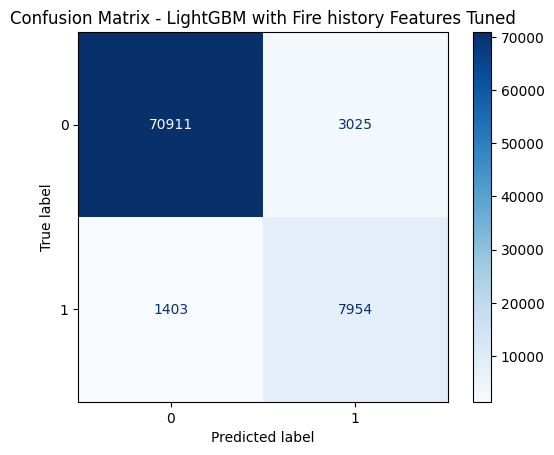

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_new)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - LightGBM with Fire history Features Tuned")
plt.show()

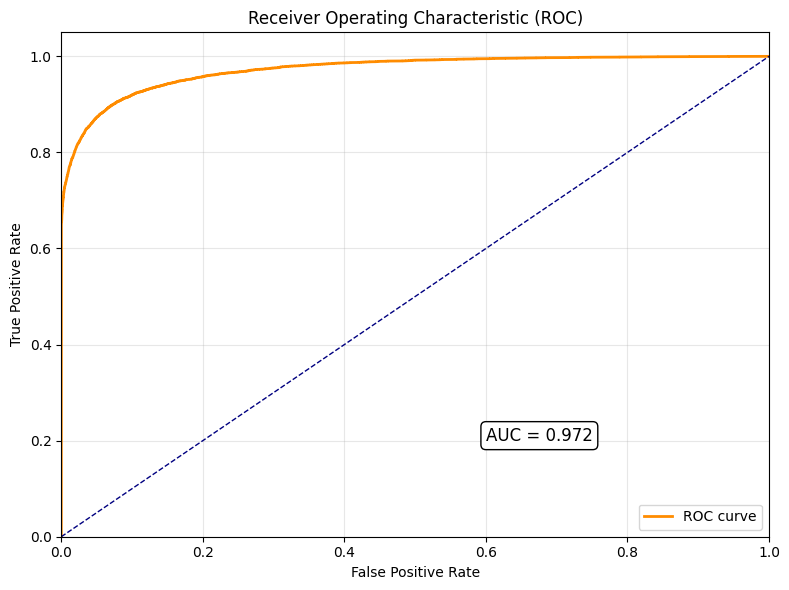

In [ ]:
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')  # Diagonal line

# Add AUC value on the plot
plt.text(0.6, 0.2, f'AUC = {roc_auc:.3f}', fontsize=12, color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and formatting
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

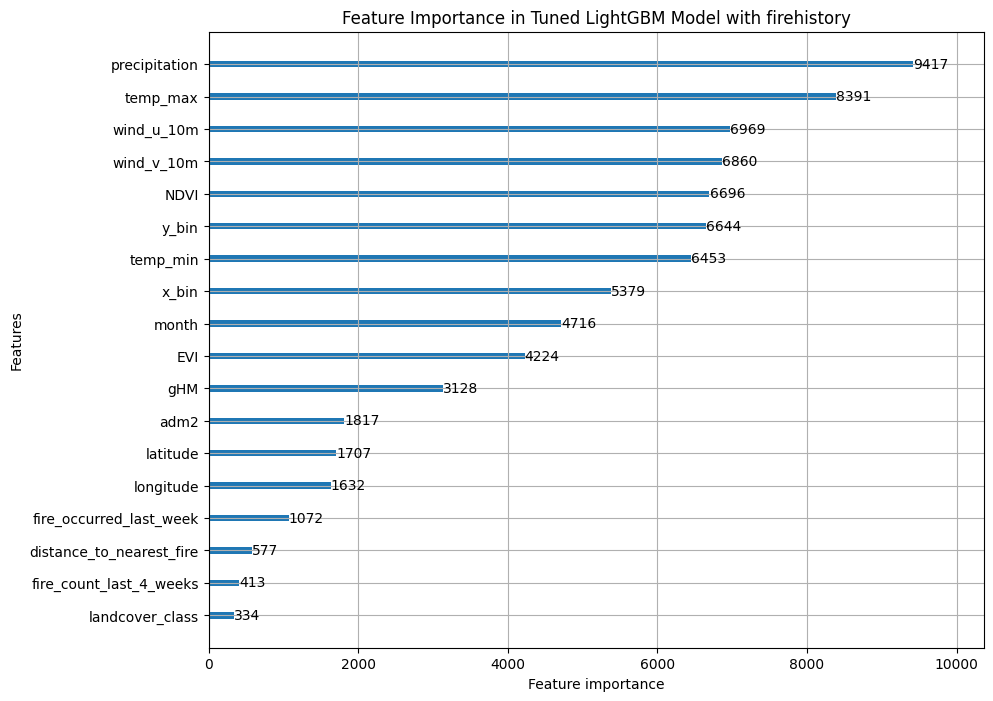

In [ ]:
lgb.plot_importance(final_model,
                    importance_type='split',
                    max_num_features=20,
                    figsize=(10, 8),
                    title='Feature Importance in Tuned LightGBM Model with firehistory')
plt.show()


In [ ]:
#save the model

import joblib

# save `Tuned_model_static`
joblib.dump(final_model, 'lightgbm_firehistory_tuned.pkl')

['lightgbm_firehistory_tuned.pkl']

**Probability Calibration**

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

# using isotonic calibration
calibrated_model = CalibratedClassifierCV(final_model, method='sigmoid', cv=5)
calibrated_model.fit(X_train_best, y_train_best)


[LightGBM] [Info] Number of positive: 18868, number of negative: 131697
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2699
[LightGBM] [Info] Number of data points in the train set: 150565, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.125315 -> initscore=-1.943036
[LightGBM] [Info] Start training from score -1.943036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

CalibratedClassifierCV(cv=5,
                       estimator=LGBMClassifier(colsample_bytree=0.8960309344431737,
                                                learning_rate=0.010180964853393615,
                                                max_depth=4,
                                                min_child_samples=69,
                                                n_estimators=265, num_leaves=48,
                                                subsample=0.6715619340884394))

# **XGboost Model (Scenario B)**

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

In [ ]:
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name', 'fire_label',
             'fire_count', 'frp__MW', 'fire_count_last_4_weeks', 'fire_occurred_last_week',
             "distance_to_nearest_fire"]


# Temporal split based on 'year_week'
train_mask = df['year_week'].str.startswith(('2022', '2023'))  # Training data from 2022 and 2023
test_mask = df['year_week'].str.startswith('2024')  # Test data from 2024

train_data = df[train_mask]
test_data = df[test_mask]

X_train1 = train_data.drop(columns=drop_cols)
y_train1 = train_data['fire_label']

X_test1 = test_data.drop(columns=drop_cols)
y_test1 = test_data['fire_label']

# --- Initialize and Train the XGBoost Model for Binary Classification ---
XG_model1 = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False)
XG_model1.fit(X_train1, y_train1)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:38:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
# --- Make Predictions ---
y_pred = XG_model1.predict(X_test1)
y_proba= XG_model1.predict_proba(X_test1)[:, 1]

# --- Evaluate the Model ---
print("Accuracy Score:", accuracy_score(y_test1, y_pred))
print("Classification Report:\n", classification_report(y_test1, y_pred))

# Print ROC AUC
print("ROC AUC Score:", roc_auc_score(y_test1, y_proba))

Accuracy Score: 0.9198492070161959
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.92      0.95     73936
         1.0       0.60      0.88      0.71      9357

    accuracy                           0.92     83293
   macro avg       0.79      0.90      0.83     83293
weighted avg       0.94      0.92      0.93     83293

ROC AUC Score: 0.9677467674384359


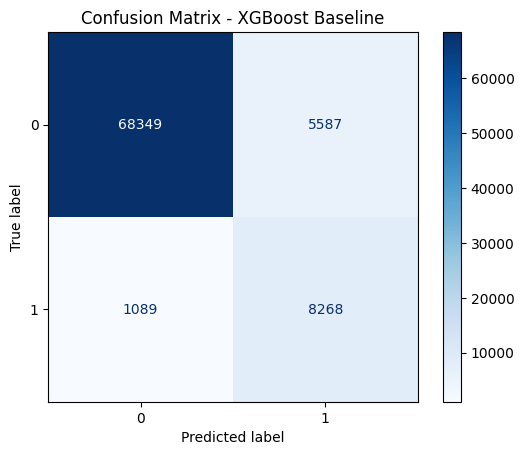

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test1, y_pred)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - XGBoost Baseline")
plt.show()

In [ ]:
#Tuning XGboost model with no firehistory features

import numpy as np
import optuna
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import DMatrix
from sklearn.metrics import f1_score, classification_report, roc_auc_score, precision_recall_curve
from sklearn.model_selection import TimeSeriesSplit

# 1) Prepare Train (2022–23) vs Test (2024)
drop_cols = [
    'year_week', 'date', 'grid_zone', 'landcover_class_name',
    'fire_label', 'fire_count', 'frp__MW',
    'fire_count_last_4_weeks', 'fire_occurred_last_week',
    'distance_to_nearest_fire'
]

train_mask = df['year_week'].str.startswith(('2022','2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

# 2) TimeSeriesSplit for 2022–23
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    # 1) Define hyperparameter search space
    params = {
        'objective':           'binary:logistic',
        'eval_metric':         'logloss',
        'learning_rate':       trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'max_depth':           trial.suggest_int('max_depth', 3, 10),
        'min_child_weight':    trial.suggest_int('min_child_weight', 1, 10),
        'subsample':           trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':    trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma':               trial.suggest_float('gamma', 0, 5),
        'reg_alpha':           trial.suggest_float('reg_alpha', 0, 10),
        'reg_lambda':          trial.suggest_float('reg_lambda', 0, 10),
        'scale_pos_weight':    trial.suggest_float('scale_pos_weight', 1, 5),
        'seed':                42,
        'verbosity':           0
    }
    # We'll tune number of boosting rounds separately:
    num_round = trial.suggest_int('n_estimators', 100, 1000)

    f1_scores = []
    # 2) Rolling-window CV inside 2022–23
    for train_idx, val_idx in tscv.split(X_train_full):
        X_tr, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_tr, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        dtrain = DMatrix(X_tr, label=y_tr)
        dval   = DMatrix(X_val, label=y_val)

        bst = xgb.train(
            params,
            dtrain,
            num_boost_round=num_round,
            evals=[(dval, 'validation')],
            early_stopping_rounds=50,
            verbose_eval=False
        )

        preds = (bst.predict(dval) >= 0.5).astype(int)
        f1_scores.append(f1_score(y_val, preds))

    # 3) Return the mean F1 across folds
    return np.mean(f1_scores)

# 3) Run Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, timeout=3600)

print("Best CV F1:", study.best_value)
print("Best Params:", study.best_params)


[I 2025-05-09 22:38:28,610] A new study created in memory with name: no-name-89cf220a-917b-4e64-943d-bf529468668e
[I 2025-05-09 22:38:52,267] Trial 0 finished with value: 0.8311857594132308 and parameters: {'learning_rate': 0.04444006383099987, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.8432794138452337, 'colsample_bytree': 0.5953127729576313, 'gamma': 2.1912338014990778, 'reg_alpha': 9.288512495570087, 'reg_lambda': 8.515960409799003, 'scale_pos_weight': 4.689884724276613, 'n_estimators': 376}. Best is trial 0 with value: 0.8311857594132308.
[I 2025-05-09 22:39:07,048] Trial 1 finished with value: 0.8582640822684908 and parameters: {'learning_rate': 0.020328083159656785, 'max_depth': 10, 'min_child_weight': 9, 'subsample': 0.974296906659856, 'colsample_bytree': 0.780374825673273, 'gamma': 3.6603946852434435, 'reg_alpha': 9.709910061004758, 'reg_lambda': 0.9070565933969854, 'scale_pos_weight': 2.909151814324738, 'n_estimators': 120}. Best is trial 1 with value: 0.85826408226

Best CV F1: 0.8785319621013585
Best Params: {'learning_rate': 0.03624911279674832, 'max_depth': 9, 'min_child_weight': 8, 'subsample': 0.9438360527861186, 'colsample_bytree': 0.6846109855268474, 'gamma': 0.5298848769598731, 'reg_alpha': 1.1177010216168966, 'reg_lambda': 6.173992755590751, 'scale_pos_weight': 1.5456191741765222, 'n_estimators': 576}


TypeError: 'XGBClassifier' object is not callable

In [ ]:
# 4) Retrain best model on all 2022–23 and evaluate on 2024
best_params = study.best_params
XGmodel_static_best = XGBClassifier(
    **best_params,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42,
    n_jobs=-1
)
XGmodel_static_best.fit(X_train_full, y_train_full)

# 5) Predict probabilities on test set
probs = XGmodel_static_best.predict_proba(X_test)[:, 1]

# 6) Threshold tuning for balanced precision/recall
prec, rec, thresh = precision_recall_curve(y_test, probs)
# Choose threshold where recall >= 0.85
cands = [(t, p, r) for p, r, t in zip(prec, rec, list(thresh) + [1.0]) if r >= 0.85]
best_t = sorted(cands, key=lambda x: x[1], reverse=True)[0][0]
print(f"\nOptimal threshold for recall >= 0.85: {best_t:.3f}")

# 7) Apply threshold
y_pred_static = (probs >= best_t).astype(int)
print("Classification Report:\n", classification_report(y_test, y_pred_static))

# 8) ROC AUC Score using full probabilities
auc = roc_auc_score(y_test, probs)
print("ROC AUC Score:", round(auc, 4))


Optimal threshold for recall >= 0.85: 0.741
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.96      0.97     73936
         1.0       0.74      0.85      0.79      9357

    accuracy                           0.95     83293
   macro avg       0.86      0.91      0.88     83293
weighted avg       0.95      0.95      0.95     83293

ROC AUC Score: 0.9715


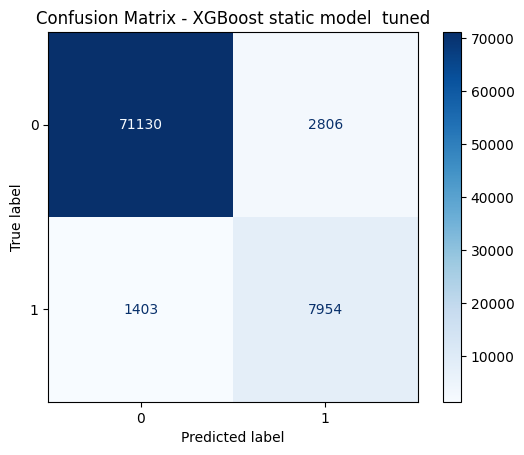

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_static)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - XGBoost static model  tuned")
plt.show()

In [ ]:
lgb.plot_importance(XGmodel_static_best,
                    importance_type='split',
                    max_num_features=20,
                    figsize=(10, 8),
                    title='Feature Importance in Tuned XGboost Model withput firehistory')
plt.show()

In [ ]:
import joblib

# Assume your trained model is named `Tuned_model_static`
joblib.dump(XGmodel_static_best, 'XGboost_static_model_tuned.pkl')


['XGboost_static_model_tuned.pkl']

Text(0.5, 0, 'Importance (Gain)')

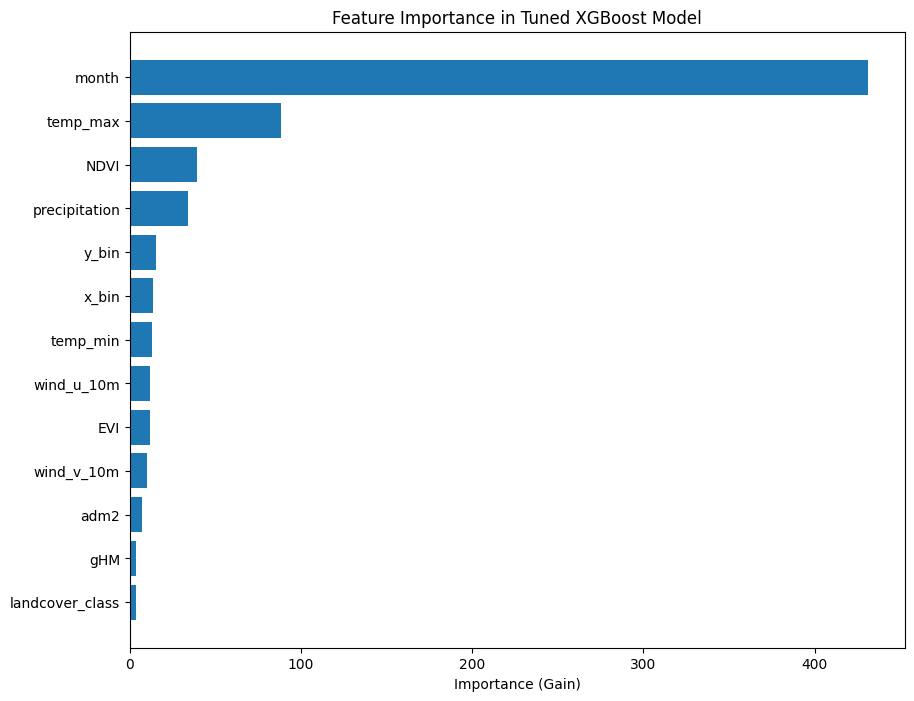

In [ ]:
import joblib
import matplotlib.pyplot as plt
from xgboost import plot_importance
import matplotlib.ticker as mticker
import pandas as pd

# Load the model
XGmodel_best = joblib.load("/content/XGboost_static_model_tuned (1).pkl")

# Extract booster and feature importance
booster = XGmodel_best.get_booster()
importance_dict = booster.get_score(importance_type='gain')

# Convert to DataFrame and remove 'latitude' and 'longitude'
imp_df = pd.DataFrame(list(importance_dict.items()), columns=["Feature", "Importance"])
imp_df = imp_df[~imp_df["Feature"].isin(["latitude", "longitude"])]

# Sort and take top 20
imp_df = imp_df.sort_values(by="Importance", ascending=False).head(20)

# Plot manually
fig, ax = plt.subplots(figsize=(10, 8))
ax.barh(imp_df["Feature"], imp_df["Importance"])
ax.invert_yaxis()  # Highest importance on top
ax.set_title("Feature Importance in Tuned XGBoost Model")
ax.set_xlabel("Importance (Gain)")

In [ ]:
pip install shap


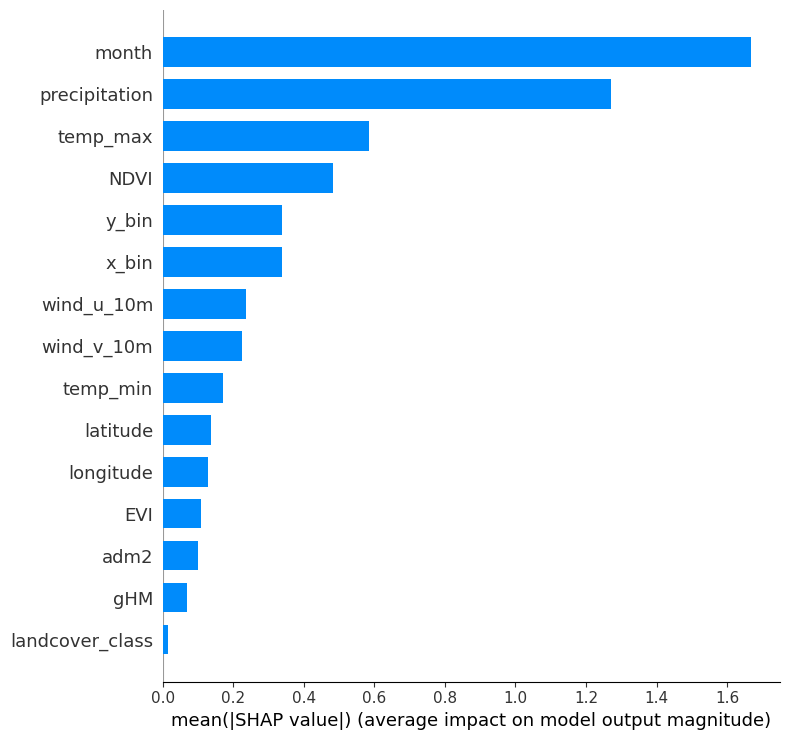

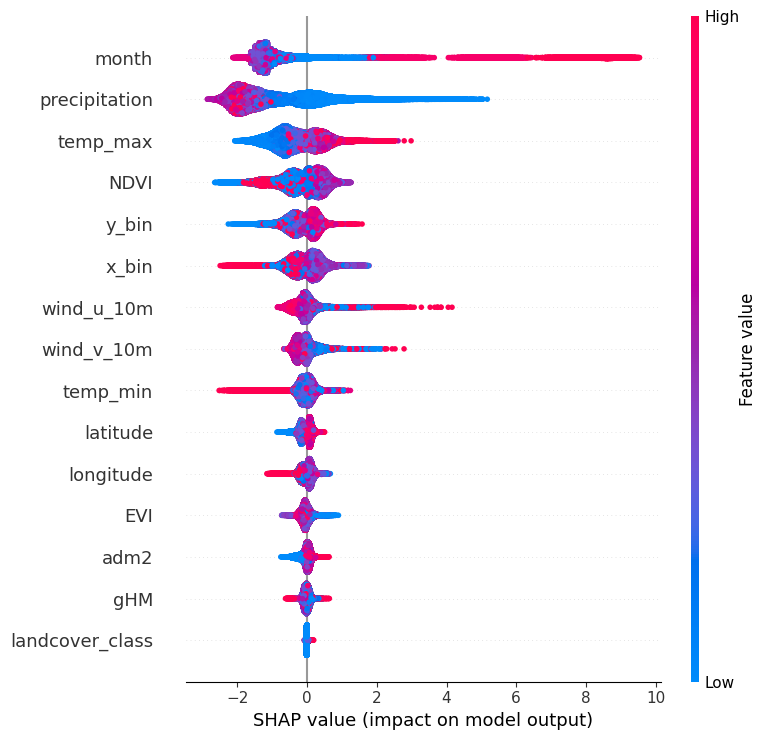

In [ ]:
import shap
import joblib
import matplotlib.pyplot as plt
import pandas as pd

# Load model
XGmodel_best = joblib.load("/content/XGboost_static_model_tuned (1).pkl")
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name', 'fire_label',
             'fire_count', 'frp__MW', 'fire_count_last_4_weeks', 'fire_occurred_last_week',
             "distance_to_nearest_fire"]


# Temporal split based on 'year_week'
train_mask = df['year_week'].str.startswith(('2022', '2023'))  # Training data from 2022 and 2023
test_mask = df['year_week'].str.startswith('2024')  # Test data from 2024

train_data = df[train_mask]
test_data = df[test_mask]

X_train1 = train_data.drop(columns=drop_cols)
y_train1 = train_data['fire_label']

X_test1 = test_data.drop(columns=drop_cols)
y_test1 = test_data['fire_label']


# Choose dataset to explain (e.g., X_test1)
X = X_train1.copy()

# Create SHAP explainer for XGBoost model
explainer = shap.Explainer(XGmodel_best)

# Calculate SHAP values for your dataset
shap_values = explainer(X)

# Summary plot (bar) of mean absolute SHAP values for feature importance
shap.summary_plot(shap_values, X, plot_type="bar")

# Beeswarm plot showing detailed SHAP values distribution
shap.summary_plot(shap_values, X)


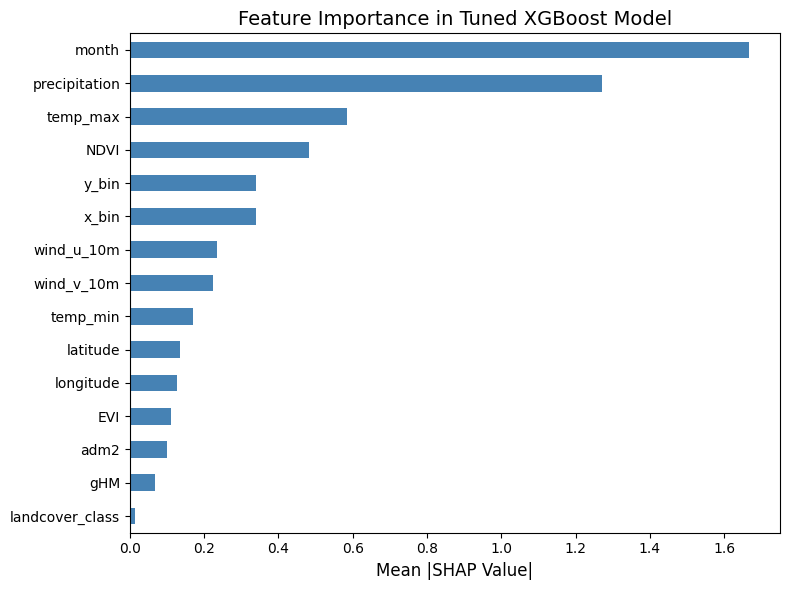

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Calculate mean absolute SHAP values per feature
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)

# Create Series and sort descending (highest to lowest)
shap_importance = pd.Series(mean_abs_shap, index=X.columns).sort_values(ascending=False)

# Plot horizontal bar chart with solid steelblue color
plt.figure(figsize=(8,6))
shap_importance.plot(kind='barh', color='steelblue')
plt.title("Feature Importance in Tuned XGBoost Model", fontsize=14)
plt.xlabel("Mean |SHAP Value|", fontsize=12)
plt.gca().invert_yaxis()  # Highest value on top
plt.tight_layout()
plt.savefig("fig17.png")
plt.show()


# **XGboost model with Firehistory features (Scenario A)**

In [ ]:
# --- Define Features and Target ---
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name',
             'fire_label', 'fire_count', 'frp__MW']

# Prepare Features and Target for XGBoost
X2 = df.drop(columns=drop_cols)
y2 = df['fire_label']

# Train-test split based on year filtering (same as before)
train_mask = df['year_week'].str.startswith(('2022', '2023'))
test_mask = df['year_week'].str.startswith('2024')

X_train2 = X2[train_mask]
y_train2 = y2[train_mask]

X_test2 = X2[test_mask]
y_test2 = y2[test_mask]

# --- Train XGBoost Model (XG_model2) ---
# Define and train the model
XG_model2 = xgb.XGBClassifier(eval_metric='logloss', use_label_encoder=False)
XG_model2.fit(X_train2, y_train2)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:46:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
# --- Make Predictions ---
y_pred2 = XG_model2.predict(X_test2)
y_proba2= XG_model2.predict_proba(X_test2)[:, 1]

# --- Evaluate the Model ---
print("Accuracy Score:", accuracy_score(y_test2, y_pred2))
print("Classification Report:\n", classification_report(y_test2, y_pred2))

# Print ROC AUC
print("ROC AUC Score:", roc_auc_score(y_test2, y_proba2))

Accuracy Score: 0.9001611692769528
Classification Report:
               precision    recall  f1-score   support

         0.0       0.99      0.90      0.94     72108
         1.0       0.53      0.91      0.67      9173

    accuracy                           0.90     81281
   macro avg       0.76      0.90      0.81     81281
weighted avg       0.94      0.90      0.91     81281

ROC AUC Score: 0.9683897871048969


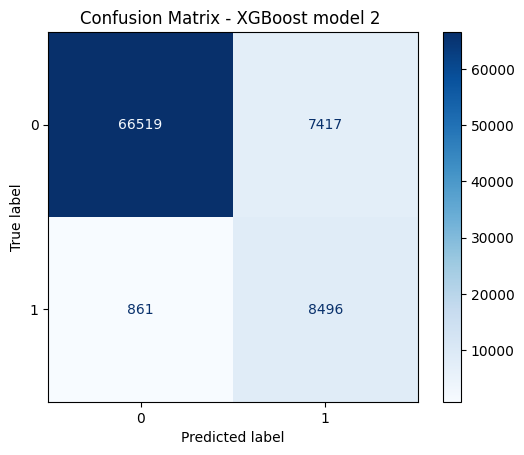

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test2, y_pred2)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - XGBoost model 2 ")
plt.show()

In [ ]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_auc_score

# Predictions
y_train_pred = XG_model2.predict(X_train2)
y_test_pred = XG_model2.predict(X_test2)

# Probabilities for AUC
y_train_prob = XG_model2.predict_proba(X_train2)[:, 1]
y_test_prob = XG_model2.predict_proba(X_test2)[:, 1]

# Train Metrics
print("\n--- Train Metrics ---")
print("Accuracy :", round(accuracy_score(y_train2, y_train_pred), 4))
print("F1 Score :", round(f1_score(y_train2, y_train_pred), 4))
print("ROC AUC  :", round(roc_auc_score(y_train2, y_train_prob), 4))

# Test Metrics
print("\n--- Test Metrics ---")
print("Accuracy :", round(accuracy_score(y_test2, y_test_pred), 4))
print("F1 Score :", round(f1_score(y_test2, y_test_pred), 4))
print("ROC AUC  :", round(roc_auc_score(y_test2, y_test_prob), 4))



--- Train Metrics ---
Accuracy : 0.9874
F1 Score : 0.9488
ROC AUC  : 0.9978

--- Test Metrics ---
Accuracy : 0.9002
F1 Score : 0.6719
ROC AUC  : 0.9684


In [ ]:
#Tuning XGboost model with  firehistory features
import numpy as np
import optuna
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import DMatrix
from sklearn.metrics import f1_score, classification_report, roc_auc_score, precision_recall_curve
from sklearn.model_selection import TimeSeriesSplit

# 1) Prepare Train (2022–23) vs Test (2024)
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name',
             'fire_label', 'fire_count', 'frp__MW']

train_mask = df['year_week'].str.startswith(('2022','2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

# 2) TimeSeriesSplit for 2022–23
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    # 1) Define hyperparameter search space
    params = {
        'objective':           'binary:logistic',
        'eval_metric':         'logloss',
        'learning_rate':       trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'max_depth':           trial.suggest_int('max_depth', 3, 10),
        'min_child_weight':    trial.suggest_int('min_child_weight', 1, 10),
        'subsample':           trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':    trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma':               trial.suggest_float('gamma', 0, 5),
        'reg_alpha':           trial.suggest_float('reg_alpha', 0, 10),
        'reg_lambda':          trial.suggest_float('reg_lambda', 0, 10),
        'scale_pos_weight':    trial.suggest_float('scale_pos_weight', 1, 5),
        'seed':                42,
        'verbosity':           0
    }
    # We'll tune number of boosting rounds separately:
    num_round = trial.suggest_int('n_estimators', 100, 1000)

    f1_scores = []
    # 2) Rolling-window CV inside 2022–23
    for train_idx, val_idx in tscv.split(X_train_full):
        X_tr, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        y_tr, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        dtrain = DMatrix(X_tr, label=y_tr)
        dval   = DMatrix(X_val, label=y_val)

        bst = xgb.train(
            params,
            dtrain,
            num_boost_round=num_round,
            evals=[(dval, 'validation')],
            early_stopping_rounds=50,
            verbose_eval=False
        )

        preds = (bst.predict(dval) >= 0.5).astype(int)
        f1_scores.append(f1_score(y_val, preds))

    # 3) Return the mean F1 across folds
    return np.mean(f1_scores)

# 3) Run Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=3600)

print("Best CV F1:", study.best_value)
print("Best Params:", study.best_params)

# 4) Retrain best model on all 2022–23 and evaluate on 2024
best_params = study.best_params
XGmodel_best = XGBClassifier(
    **best_params,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42,
    n_jobs=-1
)
XGmodel_best.fit(X_train_full, y_train_full)

# 5) Predict probabilities on test set
probs = XGmodel_best.predict_proba(X_test)[:, 1]

# 6) Threshold tuning for balanced precision/recall
prec, rec, thresh = precision_recall_curve(y_test, probs)
# Choose threshold where recall >= 0.85
cands = [(t, p, r) for p, r, t in zip(prec, rec, list(thresh) + [1.0]) if r >= 0.85]
best_t = sorted(cands, key=lambda x: x[1], reverse=True)[0][0]
print(f"\nOptimal threshold for recall >= 0.85: {best_t:.3f}")

# 7) Apply threshold
y_pred_best = (probs >= best_t).astype(int)
print("Classification Report:\n", classification_report(y_test, y_pred_best))

# 8) ROC AUC Score using full probabilities
auc = roc_auc_score(y_test, probs)
print("ROC AUC Score:", round(auc, 4))

[I 2025-05-09 23:55:35,560] A new study created in memory with name: no-name-a8b0c647-addb-4654-8c2d-00e2d29a06d3
[I 2025-05-09 23:55:55,707] Trial 0 finished with value: 0.881898374036958 and parameters: {'learning_rate': 0.04092767698235422, 'max_depth': 4, 'min_child_weight': 10, 'subsample': 0.6364996486254836, 'colsample_bytree': 0.9032269966421074, 'gamma': 4.41355480686277, 'reg_alpha': 1.5017178822980215, 'reg_lambda': 2.7176432816161347, 'scale_pos_weight': 2.691967342703897, 'n_estimators': 262}. Best is trial 0 with value: 0.881898374036958.
[I 2025-05-09 23:56:58,262] Trial 1 finished with value: 0.8836686365063118 and parameters: {'learning_rate': 0.011166062503708515, 'max_depth': 9, 'min_child_weight': 5, 'subsample': 0.5567647538116369, 'colsample_bytree': 0.6398953981766642, 'gamma': 4.726016646732164, 'reg_alpha': 3.8076121804640275, 'reg_lambda': 4.883406442499085, 'scale_pos_weight': 3.6909446340112293, 'n_estimators': 689}. Best is trial 1 with value: 0.88366863650

Best CV F1: 0.8977691435403617
Best Params: {'learning_rate': 0.021530119357194007, 'max_depth': 10, 'min_child_weight': 5, 'subsample': 0.831896006001594, 'colsample_bytree': 0.6617464063243638, 'gamma': 0.758980179739004, 'reg_alpha': 8.031311015215035, 'reg_lambda': 8.276024725705177, 'scale_pos_weight': 1.4733001302570692, 'n_estimators': 907}

Optimal threshold for recall >= 0.85: 0.807
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.97      0.97     73936
         1.0       0.77      0.85      0.81      9357

    accuracy                           0.95     83293
   macro avg       0.87      0.91      0.89     83293
weighted avg       0.96      0.95      0.95     83293

ROC AUC Score: 0.9733


Text(0.5, 1.0, 'Confusion Matrix - XGBoost model Tned')

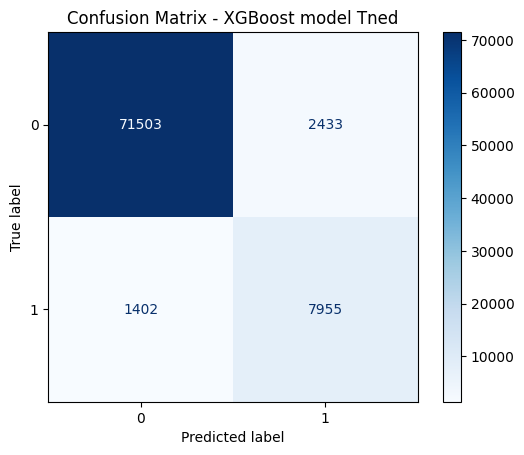

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_best)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - XGBoost model Tned")

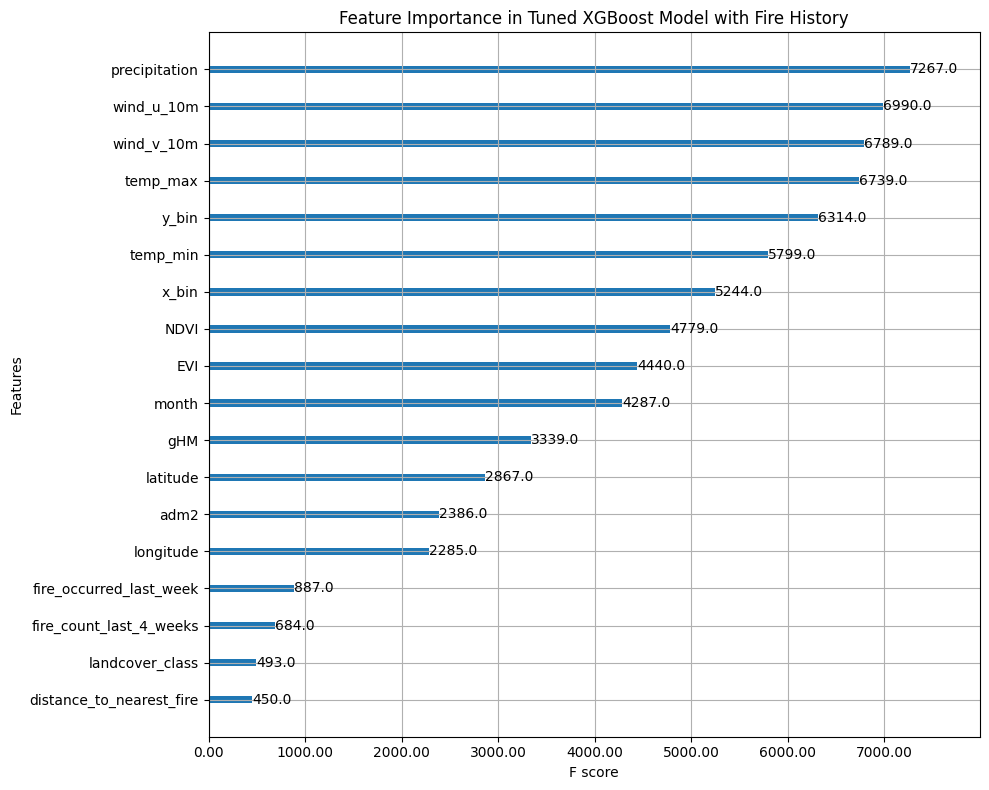

In [ ]:
import joblib
import matplotlib.pyplot as plt
from xgboost import plot_importance
import matplotlib.ticker as mticker

# Load the model
XGmodel_best = joblib.load("/content/XGboost_firehistory_tuned (1).pkl")

# Create the plot with proper figure size
fig, ax = plt.subplots(figsize=(10, 8))
plot_importance(XGmodel_best,
                importance_type='weight',
                max_num_features=20,
                title='Feature Importance in Tuned XGBoost Model with Fire History',
                ax=ax)

# Format tick labels to 2 decimal places, no commas
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:.2f}'))

plt.tight_layout()
plt.show()



Text(0.5, 0, 'Importance (Weight)')

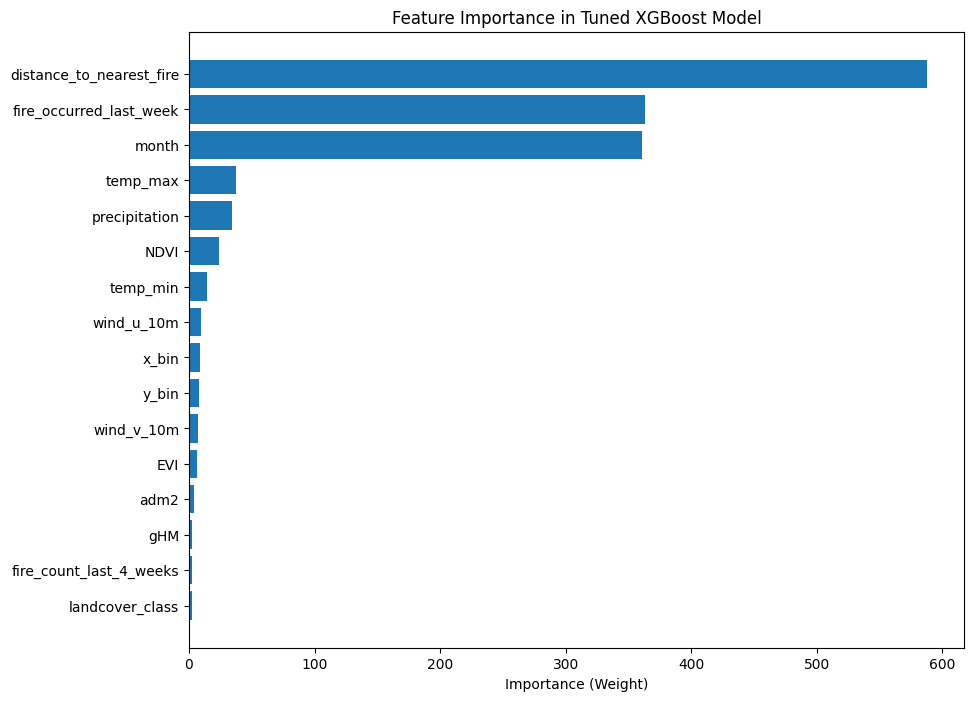

In [ ]:
import joblib
import matplotlib.pyplot as plt
from xgboost import plot_importance
import matplotlib.ticker as mticker
import pandas as pd
# Load the model
XGmodel_best = joblib.load("/content/XGboost_firehistory_tuned_uncal.pkl")

# Extract booster and feature importance
booster = XGmodel_best.get_booster()
importance_dict = booster.get_score(importance_type='gain')

# Convert to DataFrame and remove 'latitude' and 'longitude'
imp_df = pd.DataFrame(list(importance_dict.items()), columns=["Feature", "Importance"])
imp_df = imp_df[~imp_df["Feature"].isin(["latitude", "longitude"])]

# Sort and take top 20
imp_df = imp_df.sort_values(by="Importance", ascending=False).head(20)

# Plot manually
fig, ax = plt.subplots(figsize=(10, 8))
ax.barh(imp_df["Feature"], imp_df["Importance"])
ax.invert_yaxis()  # Highest importance on top
ax.set_title("Feature Importance in Tuned XGBoost Model")
ax.set_xlabel("Importance (Gain)")

In [ ]:
import joblib

joblib.dump(XGmodel_best, 'XGboost_firehistory_tuned.pkl')


['XGboost_firehistory_tuned.pkl']

# **probability calibration of the tuned XGBoost (Scenario A)**

In [ ]:
#import the tuned XGboost
import joblib

# Load the model
xgb_model = joblib.load("/content/XGboost_firehistory_tuned_uncal.pkl")

In [ ]:
drop_cols = [
    'year_week', 'date', 'grid_zone', 'landcover_class_name',
    'fire_label', 'fire_count', 'frp__MW'
]

train_mask = df['year_week'].str.startswith(('2022','2023'))
test_mask  = df['year_week'].str.startswith('2024')

train_data = df[train_mask].reset_index(drop=True)
test_data  = df[test_mask].reset_index(drop=True)

X_train_full = train_data.drop(columns=drop_cols)
y_train_full = train_data['fire_label']

X_test       = test_data.drop(columns=drop_cols)
y_test       = test_data['fire_label']

In [ ]:
y_probs = xgb_model.predict_proba(X_test)[:, 1]

In [ ]:
from sklearn.model_selection import train_test_split

# X and y should be your full test set features and labels
X_calib, X_eval, y_calib, y_eval = train_test_split(X_test, y_test, test_size=0.5, random_state=42, stratify=y_test)


**Sigmoid Calibration**

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

# Calibrate on a held-out set using the already trained model
calibrated_model = CalibratedClassifierCV(estimator=xgb_model, method='sigmoid', cv='prefit')
calibrated_model.fit(X_calib, y_calib)

/usr/local/lib/python3.11/dist-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


CalibratedClassifierCV(cv='prefit',
                       estimator=XGBClassifier(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytree=0.6617464063243638,
                                               device=None,
                                               early_stopping_rounds=None,
                                               enable_categorical=False,
                                               eval_metric='logloss',
                                               feature_types=None,
                                               gamma=0.758980179739004,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=0.021530119357194007,
                                               max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=10, max_leaves=None,
                                               min_child_weight=5, missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=907, n_jobs=-1,
                                               num_parallel_tree=None,
                                               random_state=42, ...))

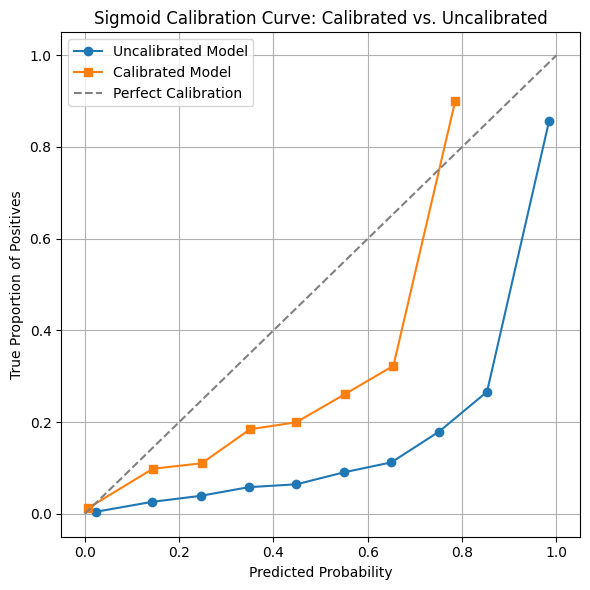

In [ ]:
from sklearn.calibration import calibration_curve

# Get uncalibrated and calibrated probabilities
y_probs_uncal = y_probs              # This is your model's original (uncalibrated) output
y_probs_cal = calibrated_model.predict_proba(X_test)[:, 1]

# Compute calibration curves
prob_true_uncal, prob_pred_uncal = calibration_curve(y_test, y_probs_uncal, n_bins=10)
prob_true_cal, prob_pred_cal = calibration_curve(y_test, y_probs_cal, n_bins=10)

# Plot both
plt.figure(figsize=(6, 6))
plt.plot(prob_pred_uncal, prob_true_uncal, marker='o', label='Uncalibrated Model')
plt.plot(prob_pred_cal, prob_true_cal, marker='s', label='Calibrated Model')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')

# Formatting
plt.xlabel('Predicted Probability')
plt.ylabel('True Proportion of Positives')
plt.title('Sigmoid Calibration Curve: Calibrated vs. Uncalibrated')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import brier_score_loss

print("Brier score (uncalibrated):", brier_score_loss(y_test, y_probs_uncal))
print("Brier score (Sigmoid calibration):", brier_score_loss(y_test, y_probs_cal))


Brier score (uncalibrated): 0.06410053666221395
Brier score (Sigmoid calibration): 0.034211766120368574


**Isotonic Calibration**

In [ ]:
from sklearn.calibration import CalibratedClassifierCV
calibrated_model_iso = CalibratedClassifierCV(estimator=xgb_model, method='isotonic', cv='prefit')
calibrated_model_iso.fit(X_calib, y_calib)

/usr/local/lib/python3.11/dist-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


CalibratedClassifierCV(cv='prefit',
                       estimator=XGBClassifier(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytree=0.6617464063243638,
                                               device=None,
                                               early_stopping_rounds=None,
                                               enable_categorical=False,
                                               eval_metric='logloss',
                                               feature_types=None,
                                               gamma=0.758980179739004,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=0.021530119357194007,
                                               max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=10, max_leaves=None,
                                               min_child_weight=5, missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=907, n_jobs=-1,
                                               num_parallel_tree=None,
                                               random_state=42, ...),
                       method='isotonic')

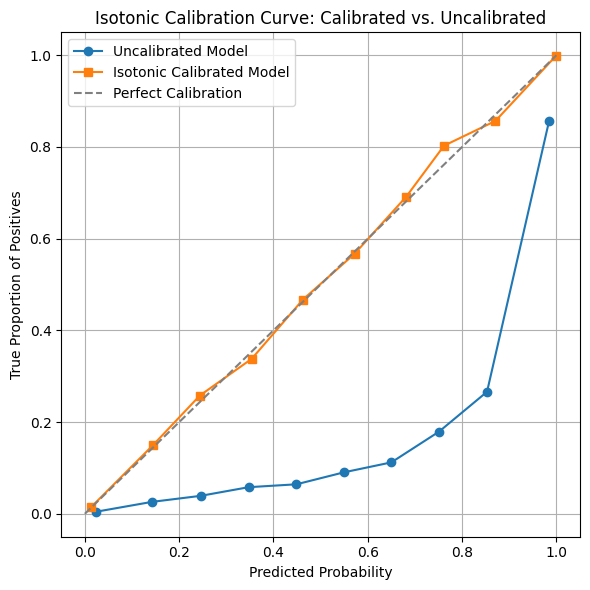

In [ ]:
from sklearn.calibration import calibration_curve

# Get uncalibrated and calibrated probabilities
y_probs_uncal = y_probs
y_probs_cal_iso = calibrated_model_iso.predict_proba(X_test)[:, 1]

# Compute Isotonic calibration curves
prob_true_uncal, prob_pred_uncal = calibration_curve(y_test, y_probs_uncal, n_bins=10)
prob_true_cal, prob_pred_cal = calibration_curve(y_test, y_probs_cal_iso, n_bins=10)

# Plot both
plt.figure(figsize=(6, 6))
plt.plot(prob_pred_uncal, prob_true_uncal, marker='o', label='Uncalibrated Model')
plt.plot(prob_pred_cal, prob_true_cal, marker='s', label='Isotonic Calibrated Model')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')

# Formatting
plt.xlabel('Predicted Probability')
plt.ylabel('True Proportion of Positives')
plt.title('Isotonic Calibration Curve: Calibrated vs. Uncalibrated')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("fig18.png")
plt.show()


In [ ]:
from sklearn.metrics import brier_score_loss

print("Brier score (uncalibrated):", brier_score_loss(y_test, y_probs_uncal))
print("Brier score (Isotonic calibration):", brier_score_loss(y_test, y_probs_cal_iso))

Brier score (uncalibrated): 0.06410053666221395
Brier score (Isotonic calibration): 0.026406810259001122


In [ ]:
import joblib

# Save the isotonic calibrated model
joblib.dump(calibrated_model_iso, 'XGboost_firehistory_tuned_calibrated.pkl')

['XGboost_firehistory_tuned_calibrated.pkl']

# **Deep learning Models**

# **ConvLSTM model (Scenario B)**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Dense, Dropout, Flatten
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import Sequence

# === Parameters ===
time_steps = 3
batch_size = 8
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name', 'fire_label',
             'fire_count', 'frp__MW', 'fire_count_last_4_weeks', 'fire_occurred_last_week',
             "distance_to_nearest_fire"]
label_col = 'fire_label'

# === Preprocessing ===
df['x_bin_shifted'] = df['x_bin'] - df['x_bin'].min()
df['y_bin_shifted'] = df['y_bin'] - df['y_bin'].min()
df['x_bin_shifted'] = df['x_bin_shifted'].astype(int)
df['y_bin_shifted'] = df['y_bin_shifted'].astype(int)

grid_cols = df['x_bin_shifted'].max() + 1
grid_rows = df['y_bin_shifted'].max() + 1

features = [col for col in df.columns if col not in drop_cols + ['x_bin', 'y_bin', 'x_bin_shifted', 'y_bin_shifted']]
df[features] = df[features].astype(np.float32)
df[features] = StandardScaler().fit_transform(df[features])

# === Week List for Splits ===
unique_weeks = sorted(df['year_week'].unique())
train_weeks = [w for w in unique_weeks if w.startswith(('2022', '2023'))]
test_weeks = [w for w in unique_weeks if w.startswith('2024')]
train_weeks_set = set(train_weeks)
test_weeks_set = set(test_weeks)

# === Custom Data Generator ===
class ConvLSTMDataGenerator(Sequence):
    def __init__(self, df, weeks_set, time_steps, features, batch_size=8, grid_rows=32, grid_cols=32, shuffle=True):
        self.df = df
        self.features = features
        self.batch_size = batch_size
        self.time_steps = time_steps
        self.grid_rows = grid_rows
        self.grid_cols = grid_cols
        self.weeks = sorted([w for w in df['year_week'].unique() if w in weeks_set])
        self.shuffle = shuffle
        self.indices = list(range(len(self.weeks) - time_steps))
        self.on_epoch_end()

    def __len__(self):
        return len(self.indices) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, idx):
        batch_indices = self.indices[idx * self.batch_size: (idx + 1) * self.batch_size]
        batch_x, batch_y = [], []

        for i in batch_indices:
            weeks = self.weeks[i:i + self.time_steps + 1]
            weekly_frames = [self.df[self.df['year_week'] == w] for w in weeks]

            # Build a mapping from (x, y) to row for each week
            frame_dicts = []
            for frame in weekly_frames:
                grid = {}
                for _, row in frame.iterrows():
                    x, y = int(row['x_bin_shifted']), int(row['y_bin_shifted'])
                    grid[(x, y)] = row
                frame_dicts.append(grid)

            # Use only locations that exist in all time_steps + 1 weeks
            common_keys = set(frame_dicts[0].keys())
            for frame_dict in frame_dicts[1:]:
                common_keys &= set(frame_dict.keys())

            for key in common_keys:
                x_seq = []
                for frame_dict in frame_dicts[:-1]:  # input weeks
                    row = frame_dict[key]
                    x_seq.append(row[self.features].values.astype(np.float32))

                label = frame_dicts[-1][key][label_col]  # label from final week
                batch_x.append(np.array(x_seq))  # shape: (time_steps, num_features)
                batch_y.append(label)

        # Reshape for ConvLSTM2D: (batch, time, rows=1, cols=1, channels)
        batch_x = np.array(batch_x).reshape(-1, self.time_steps, 1, 1, len(self.features))
        return batch_x, np.array(batch_y)

# === Instantiate Generators ===
train_gen = ConvLSTMDataGenerator(df, train_weeks_set, time_steps, features, batch_size=batch_size,
                                   grid_rows=grid_rows, grid_cols=grid_cols)
test_gen = ConvLSTMDataGenerator(df, test_weeks_set, time_steps, features, batch_size=batch_size,
                                  grid_rows=grid_rows, grid_cols=grid_cols, shuffle=False)


In [ ]:
from tensorflow.keras.layers import BatchNormalization

model = Sequential([
    ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='relu',
               input_shape=(time_steps, 1, 1, len(features)),
               padding='same', return_sequences=False),
    BatchNormalization(),
    Dropout(0.2),
    Flatten(),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


checkpoint = ModelCheckpoint(
    'best_model.keras',
    monitor='val_loss',
    save_best_only=True,      # Only save the model if it improved
    save_weights_only=False,  # Saves the full model
    verbose=1
)
# === Model Training ===
model.fit(train_gen,
          validation_data=test_gen,
          epochs=20,
          callbacks=[early_stop, checkpoint],
          verbose=1)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5614 - loss: 0.6867

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_loss improved from inf to 0.65707, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 88s 8s/step - accuracy: 0.5645 - loss: 0.6843 - val_accuracy: 0.8386 - val_loss: 0.6571
Epoch 2/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.6987 - loss: 0.5714
Epoch 2: val_loss improved from 0.65707 to 0.62924, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 70s 7s/step - accuracy: 0.7008 - loss: 0.5697 - val_accuracy: 0.8639 - val_loss: 0.6292
Epoch 3/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8008 - loss: 0.4798
Epoch 3: val_loss improved from 0.62924 to 0.60036, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 72s 7s/step - accuracy: 0.8012 - loss: 0.4787 - val_accuracy: 0.8652 - val_loss: 0.6004
Epoch 4/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8485 - loss: 0.4110
Epoch 4: val_loss improved from 0.60036 to 0.57111, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 90s 9s/step - accuracy: 0.8487 - loss: 0.4

In [ ]:
# Evaluate performance (loss and accuracy)
loss, accuracy = model.evaluate(test_gen, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 31s 5s/step - accuracy: 0.9676 - loss: 0.1573
Test Loss: 0.2035
Test Accuracy: 0.9476


In [ ]:
# Get predictions
y_pred = model.predict(test_gen)
y_pred = (y_pred > 0.5).astype(int).flatten()

5/5 ━━━━━━━━━━━━━━━━━━━━ 29s 6s/step


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import numpy as np

# === Get true labels and predicted probabilities ===
y_true = []
y_probs = []

for i in range(len(test_gen)):
    batch_x, batch_y = test_gen[i]
    y_true.extend(batch_y)
    preds = model.predict(batch_x).flatten()
    y_probs.extend(preds)

y_true = np.array(y_true)
y_probs = np.array(y_probs)

# === Convert probabilities to class labels ===
y_pred = (y_probs >= 0.5).astype(int)

# === Classification report ===
print("Classification Report:")
print(classification_report(y_true, y_pred, digits=4))

# === Confusion matrix ===
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

# === AUC Score ===
auc = roc_auc_score(y_true, y_probs)
print(f"AUC Score: {auc:.4f}")

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Classification Report:
              precision    recall  f1-score   support

         0.0     0.9625    0.9770    0.9697      1996
         1.0     0.8482    0.7718    0.8082       333

    accuracy                         0.9476      2329
   macro avg     0.9053    0.8744    0.8889      2329
weighted avg     0.9461    0.9476    0.9466      2329

Confusion Matrix:
 [[1950   46]
 [  76  257]]
AUC Score: 0.9544


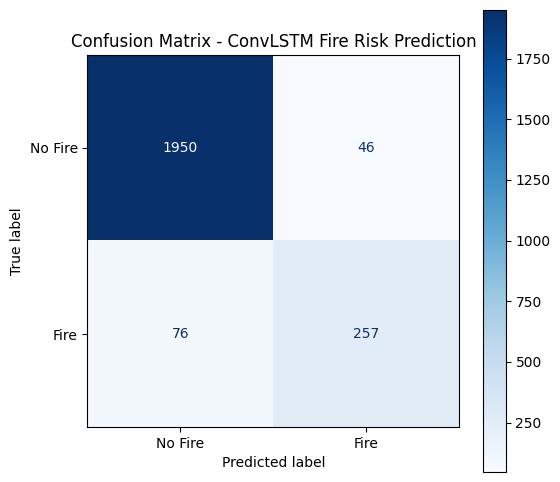

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Fire', 'Fire'])

# Plot it
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title("Confusion Matrix - ConvLSTM Fire Risk Prediction")
plt.show()

In [ ]:
from tensorflow.keras.layers import BatchNormalization

model = Sequential([
    ConvLSTM2D(filters=16, kernel_size=(1, 1), activation='relu',
               input_shape=(time_steps, 1, 1, len(features)),
               padding='same', return_sequences=False),
    BatchNormalization(),
    Dropout(0.2),
    Flatten(),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


checkpoint = ModelCheckpoint(
    'best_model.keras',
    monitor='val_loss',
    save_best_only=True,      # Only save the model if it improved
    save_weights_only=False,  # Saves the full model
    verbose=1
)
# === Model Training ===
model.fit(train_gen,
          validation_data=test_gen,
          epochs=40,
          callbacks=[early_stop, checkpoint],
          verbose=1)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/40
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5887 - loss: 0.7059
Epoch 1: val_loss improved from inf to 0.67113, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 86s 8s/step - accuracy: 0.5904 - loss: 0.7037 - val_accuracy: 0.6874 - val_loss: 0.6711
Epoch 2/40
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7240 - loss: 0.5627
Epoch 2: val_loss improved from 0.67113 to 0.63476, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 72s 7s/step - accuracy: 0.7258 - loss: 0.5612 - val_accuracy: 0.8828 - val_loss: 0.6348
Epoch 3/40
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7917 - loss: 0.4944
Epoch 3: val_loss improved from 0.63476 to 0.60113, saving model to best_model.keras
11/11 ━━━━━━━━━━━━━━━━━━━━ 82s 7s/step - accuracy: 0.7944 - loss: 0.4913 - val_accuracy: 0.9077 - val_loss: 0.6011
Epoch 4/40
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8685 - loss: 0.3998
Epoch 4: val_loss improved from 0.60113 to 0.56394, saving model to best

In [ ]:
# Evaluate performance (loss and accuracy)
loss, accuracy = model.evaluate(test_gen, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 22s 4s/step - accuracy: 0.9729 - loss: 0.0931
Test Loss: 0.1281
Test Accuracy: 0.9579


In [ ]:
# Get predictions
y_pred = model.predict(test_gen)
y_pred = (y_pred > 0.5).astype(int).flatten()

5/5 ━━━━━━━━━━━━━━━━━━━━ 23s 4s/step


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import numpy as np

# === Get true labels and predicted probabilities ===
y_true = []
y_probs = []

for i in range(len(test_gen)):
    batch_x, batch_y = test_gen[i]
    y_true.extend(batch_y)
    preds = model.predict(batch_x).flatten()
    y_probs.extend(preds)

y_true = np.array(y_true)
y_probs = np.array(y_probs)

# === Convert probabilities to class labels ===
y_pred = (y_probs >= 0.5).astype(int)

# === Classification report ===
print("Classification Report:")
print(classification_report(y_true, y_pred, digits=4))

# === Confusion matrix ===
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

# === AUC Score ===
auc = roc_auc_score(y_true, y_probs)
print(f"AUC Score: {auc:.4f}")

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Classification Report:
              precision    recall  f1-score   support

         0.0     0.9607    0.9915    0.9758      1996
         1.0     0.9368    0.7568    0.8372       333

    accuracy                         0.9579      2329
   macro avg     0.9487    0.8741    0.9065      2329
weighted avg     0.9573    0.9579    0.9560      2329

Confusion Matrix:
 [[1979   17]
 [  81  252]]
AUC Score: 0.9654


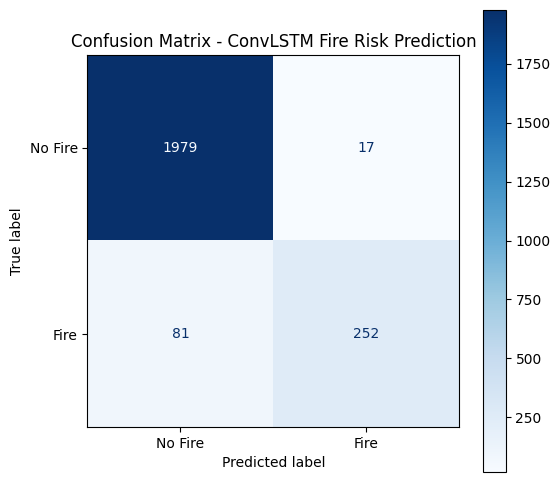

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Fire', 'Fire'])

# Plot it
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title("Confusion Matrix - ConvLSTM Fire Risk Prediction")
plt.show()

In [ ]:
model.save("bestconvlstm_tuned.h5")

In [ ]:
pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.0 MB/s eta 0:00:00


In [ ]:
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

def build_model(hp):
    model = Sequential()
    model.add(
        ConvLSTM2D(
            filters=hp.Choice('filters', [8, 16, 32]),
            kernel_size=(1, 1),  # kernel size matches your spatial dims (1x1)
            activation='relu',
            padding='same',
            return_sequences=False,
            input_shape=(time_steps, 1, 1, len(features))
        )
    )
    model.add(BatchNormalization())
    model.add(Dropout(hp.Float('dropout_1', 0.1, 0.3, step=0.1)))
    model.add(Flatten())
    model.add(Dense(hp.Int('dense_units', 16, 64, step=16), activation='relu'))
    model.add(Dropout(hp.Float('dropout_2', 0.1, 0.3, step=0.1)))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(hp.Float('learning_rate', 1e-4, 1e-2, sampling='log')),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=5,          #  increasing trials for better tuning
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='convlstm_fire'
)

tuner.search_space_summary()

tuner.search(
    train_gen,
    validation_data=test_gen,
    epochs=20,              # more epochs for tuning, adjust as needed
    callbacks=[early_stop],
    verbose=1
)

best_model = tuner.get_best_models(num_models=1)[0]
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"Best hyperparameters:")
print(f" - filters: {best_hps.get('filters')}")
print(f" - dropout_1: {best_hps.get('dropout_1')}")
print(f" - dense_units: {best_hps.get('dense_units')}")
print(f" - dropout_2: {best_hps.get('dropout_2')}")
print(f" - learning_rate: {best_hps.get('learning_rate')}")

Trial 1 Complete [00h 27m 12s]
val_loss: 0.43681976199150085

Best val_loss So Far: 0.43681976199150085
Total elapsed time: 00h 27m 12s

Search: Running Trial #2

Value             |Best Value So Far |Hyperparameter
8                 |32                |filters
0.1               |0.1               |dropout_1
16                |48                |dense_units
0.1               |0.2               |dropout_2
0.00049974        |0.00013281        |learning_rate



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 93s 8s/step - accuracy: 0.5968 - loss: 0.7001 - val_accuracy: 0.5423 - val_loss: 0.6854
Epoch 2/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 130s 7s/step - accuracy: 0.6224 - loss: 0.6824 - val_accuracy: 0.6003 - val_loss: 0.6685
Epoch 3/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 76s 7s/step - accuracy: 0.6893 - loss: 0.6209 - val_accuracy: 0.6561 - val_loss: 0.6525
Epoch 4/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 77s 7s/step - accuracy: 0.7290 - loss: 0.5912 - val_accuracy: 0.7158 - val_loss: 0.6369
Epoch 5/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 75s 7s/step - accuracy: 0.7363 - loss: 0.5774 - val_accuracy: 0.7634 - val_loss: 0.6219
Epoch 6/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 94s 9s/step - accuracy: 0.7686 - loss: 0.5506 - val_accuracy: 0.7965 - val_loss: 0.6070
Epoch 7/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 75s 7s/step - accuracy: 0.8030 - loss: 0.5109 - val_accuracy: 0.8227 - val_loss: 0.5916
Epoch 8/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 93s 9s/step - accuracy: 0.8100 - loss: 0.5010 - val_accuracy: 0.8424 - val_loss

KeyboardInterrupt: 

# **Scenarios Comparaison**

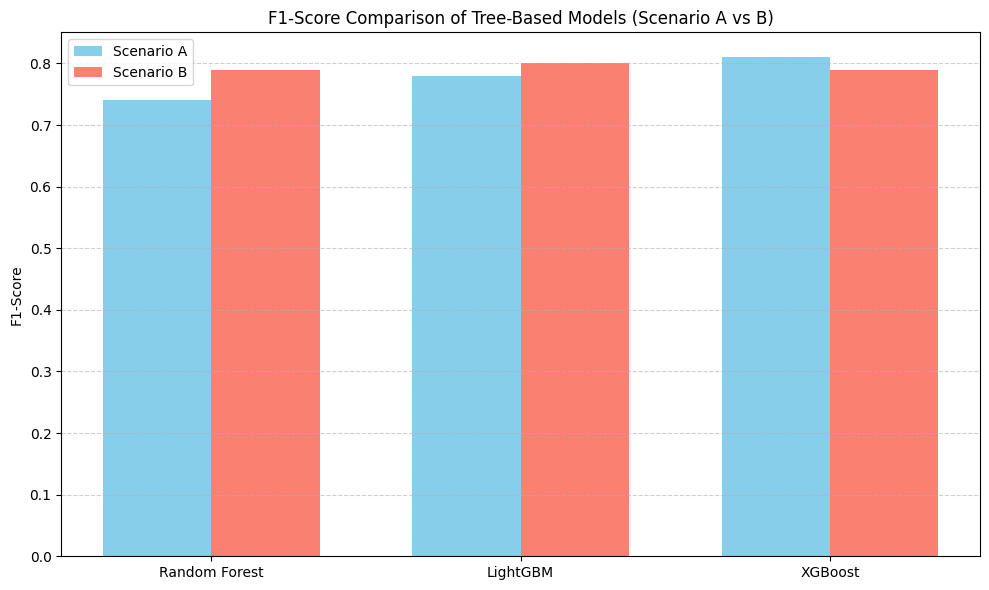

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define model names
models = ['Random Forest', 'LightGBM', 'XGBoost']

# Metrics: [Scenario A, Scenario B]
f1_scores = [0.74, 0.79, 0.78, 0.8, 0.81, 0.79]

# Grouped structure: each model repeated for A and B
labels = ['RF', 'RF', 'LGBM', 'LGBM', 'XGB', 'XGB']
scenarios = ['A', 'B'] * 3

# Set up bar plot
x = np.arange(len(models))  # group positions
width = 0.35  # width of the bars

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Bar positions
x_labels = np.arange(len(models))
bar1 = ax.bar(x_labels - width/2, [f1_scores[i*2] for i in range(3)], width, label='Scenario A', color='skyblue')
bar2 = ax.bar(x_labels + width/2, [f1_scores[i*2+1] for i in range(3)], width, label='Scenario B', color='salmon')

# Labels and formatting
ax.set_ylabel('F1-Score')
ax.set_title('F1-Score Comparison of Tree-Based Models (Scenario A vs B)')
ax.set_xticks(x_labels)
ax.set_xticklabels(models)
ax.legend()
ax.grid(True, axis='y', linestyle='--', alpha=0.6)

# Annotate values


plt.tight_layout()
plt.savefig("fig16.png")
plt.show()

# **Generate Fire risk maps with Best Model**

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df= pd.read_csv("/content/final_model_data.csv")
df

,year_week,fire_count,fire_label,x_bin,y_bin,longitude,latitude,NDVI,EVI,temp_max,...,date,month,grid_zone,adm2,fire_count_last_4_weeks,fire_occurred_last_week,distance_to_nearest_fire,landcover_class,landcover_class_name,gHM
0,2022-01,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.006022,0.083732,301.228289,...,2022-01-03,1,-52.1_-1.2,7,0,0,0.632456,10,Tree cover,0.058139
1,2022-02,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.147128,0.381171,303.283195,...,2022-01-10,1,-52.1_-1.2,7,0,0,0.447214,10,Tree cover,0.058139
2,2022-03,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.260413,0.409360,303.451469,...,2022-01-17,1,-52.1_-1.2,7,0,0,0.447214,10,Tree cover,0.058139
3,2022-04,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.061701,0.279987,301.782644,...,2022-01-24,1,-52.1_-1.2,7,0,0,0.447214,90,Herbaceous wetlands,0.057704
4,2022-05,0.0,0.0,-52.1,-1.2,-52.05,-1.15,0.046812,0.217020,302.499471,...,2022-01-31,1,-52.1_-1.2,7,0,0,0.447214,90,Herbaceous wetlands,0.057704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271495,2024-28,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.905299,0.617197,306.846186,...,2024-07-15,7,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000
271496,2024-29,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.890003,0.555556,307.425341,...,2024-07-22,7,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000
271497,2024-30,0.0,0.0,-58.5,-7.0,-58.45,-6.95,0.872591,0.588274,308.310008,...,2024-07-29,7,-58.5_-7.0,60,3,0,0.000000,10,Tree cover,0.000000
271498,2024-31,1.0,1.0,-58.5,-7.0,-58.45,-6.95,0.552773,0.444403,310.587936,...,2024-08-05,8,-58.5_-7.0,60,0,0,0.000000,10,Tree cover,0.000000


In [ ]:
pip install geobr

In [ ]:
import joblib
import pandas as pd

# Filter the test set for 2024
df_test = df[df['year_week'].str.startswith('2024')].copy()

# Drop unnecessary columns used only in training
drop_cols = ['year_week', 'date', 'grid_zone', 'landcover_class_name',
             'fire_label', 'fire_count', 'frp__MW']
X_test = df_test.drop(columns=drop_cols, errors='ignore')

# Store target to evaluate later
y_test = df_test['fire_label'] if 'fire_label' in df_test.columns else None

X_test_scaled = X_test


In [ ]:
# Load the correct model
model = joblib.load("/content/XGboost_firehistory_tuned_calibrated.pkl")


# Step 5: Predict probabilities and assign to df_test
fire_probs = model.predict_proba(X_test_scaled)[:, 1]
df_test['fire_risk_prob'] = fire_probs


In [ ]:
# Define risk levels
def categorize_risk(prob):
    if pd.isna(prob):
        return 'No Data'
    elif prob < 0.2:
        return 'Very Low'
    elif prob < 0.4:
        return 'Low'
    elif prob < 0.6:
        return 'Moderate'
    elif prob < 0.8:
        return 'High'
    else:
        return 'Very High'

In [ ]:
df_test['risk_level'] = df_test['fire_risk_prob'].apply(categorize_risk)

In [ ]:
# Filter to a specific week
week_of_interest = '2024-08'
week_df = df_test[df_test['year_week'] == week_of_interest].copy()

In [ ]:
#Get Pará Map with Municipality Layer
import geopandas as gpd

# Load the Pará municipalities GeoJSON
para_gdf = gpd.read_file("geojs-15-mun.json")

# Quick check of the data
print(para_gdf.head())  # or check columns with para_gdf.columns


        id                name         description  \
0  1500107          Abaetetuba          Abaetetuba   
1  1500131     Abel Figueiredo     Abel Figueiredo   
2  1500206               Acará               Acará   
3  1500305                Afuá                Afuá   
4  1500347  Água Azul do Norte  Água Azul do Norte   

                                            geometry  
0  POLYGON ((-48.81245 -1.60165, -48.80401 -1.607...  
1  POLYGON ((-48.57061 -4.82441, -48.54873 -4.828...  
2  POLYGON ((-48.32328 -1.46641, -48.30653 -1.470...  
3  POLYGON ((-50.19372 -0.21844, -50.11297 -0.452...  
4  POLYGON ((-50.81919 -6.27101, -50.79867 -6.284...  


In [ ]:
print("para_gdf ids:", para_gdf['id'].unique()[:5])

para_gdf ids: ['1500107' '1500131' '1500206' '1500305' '1500347']


In [ ]:
import folium
import branca.colormap as cm
from folium.plugins import MarkerCluster

# Filter only high/very high risk
high_risk_df = week_df[week_df['risk_level'].isin(['moderate', 'High', 'Very High'])]

# Create folium map
# -----------------------
m = folium.Map(location=[-3.5, -52], zoom_start=6, tiles='cartodbpositron')

# Add IBGE municipality polygons
folium.GeoJson(
    para_gdf,
    name="Pará Municipalities",
    style_function=lambda x: {
        "fillOpacity": 0.05,
        "color": "black",
        "weight": 0.7
    },
    tooltip=folium.GeoJsonTooltip(fields=["name"], aliases=["Municipality"])
).add_to(m)

# Color map by risk level
color_map = {
    'Moderate': '#feb24c',
    'High': '#e6550d',
    'Very High': '#a63603',
    'No Data': 'gray'
}

# Add fire points
marker_cluster = MarkerCluster(name='Fire Risk Points').add_to(m)

for _, row in high_risk_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color_map.get(row['risk_level'], 'gray'),
        fill=True,
        fill_opacity=0.8,
        popup=(f"Risk: {row['fire_risk_prob']:.2f}<br>Level: {row['risk_level']}"),
    ).add_to(marker_cluster)

folium.LayerControl().add_to(m)

# Display the map
m

In [ ]:
import geopandas as gpd
import pandas as pd

# Spatial join between fire alerts and municipalities
geometry = gpd.points_from_xy(week_df['longitude'], week_df['latitude'])
week_gdf = gpd.GeoDataFrame(week_df, geometry=geometry, crs=para_gdf.crs)

joined = gpd.sjoin(week_gdf, para_gdf, how='inner', predicate='within')

# Filter high/moderate/very high risk alerts
high_risk = joined[joined['risk_level'].isin(['Moderate', 'High', 'Very High'])]

# Count risk alerts per municipality
risk_counts = high_risk.groupby('name').size().reset_index(name='risk_alerts')

# Merge with municipality GeoDataFrame
choropleth_gdf = para_gdf.merge(risk_counts, on='name', how='left')
choropleth_gdf['risk_alerts'] = choropleth_gdf['risk_alerts'].fillna(0)


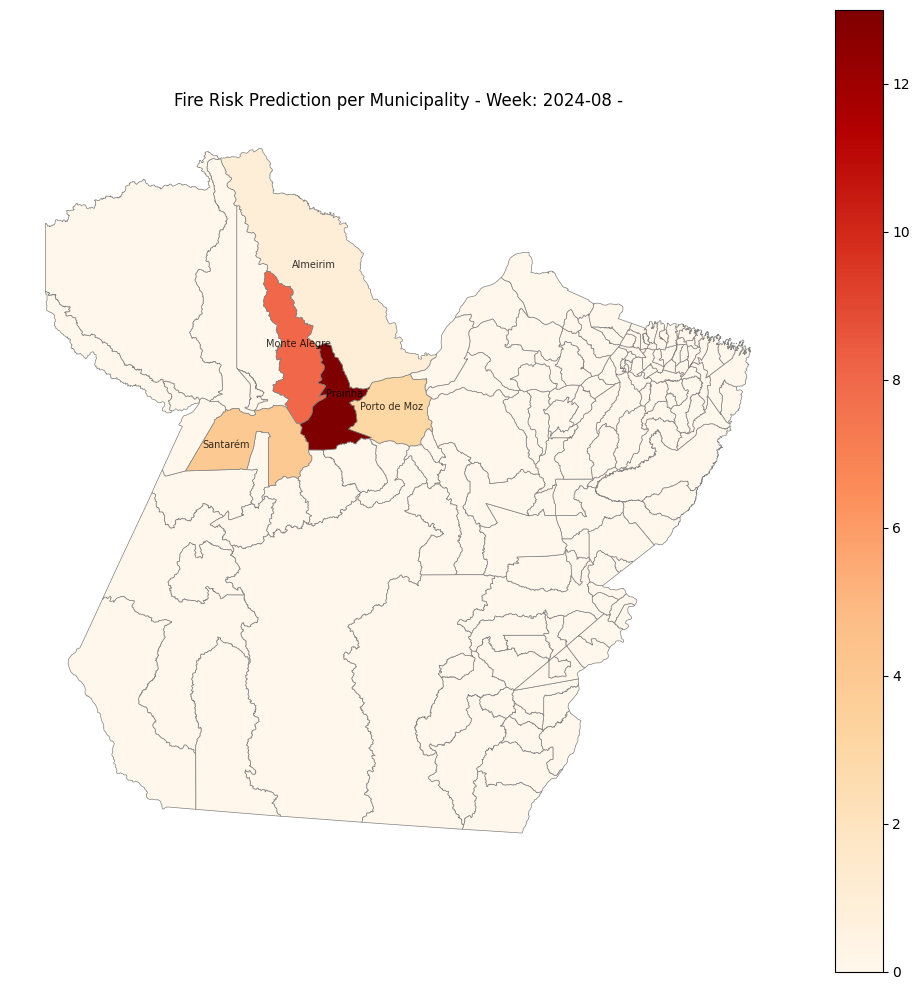

In [ ]:
import matplotlib.pyplot as plt

# Get representative point (better than centroid for irregular shapes)
choropleth_gdf['rep_point'] = choropleth_gdf.representative_point()

# Plot choropleth
fig, ax = plt.subplots(figsize=(10, 10))
choropleth_gdf.plot(
    column='risk_alerts', ax=ax, cmap='OrRd', legend=True,
    linewidth=0.5, edgecolor='gray',
    missing_kwds={"color": "lightgrey"}
)

# Add municipality names as text labels
for idx, row in choropleth_gdf.iterrows():
    if row['risk_alerts'] > 0:  # Only label municipalities with alerts
        x, y = row['rep_point'].x, row['rep_point'].y
        ax.text(x, y, row['name'], fontsize=7, ha='center', color='black', alpha=0.8)

ax.set_title(f"Fire Risk Prediction per Municipality - Week: {week_of_interest} -")
ax.axis('off')
plt.tight_layout()
plt.show()


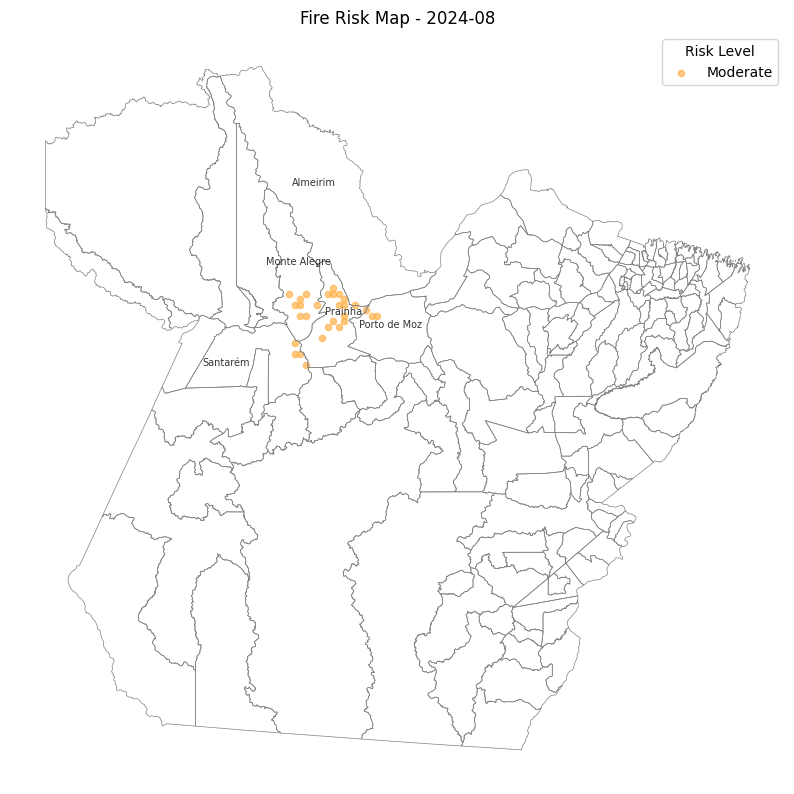

In [ ]:
import matplotlib.pyplot as plt

high_risk_df = week_df[week_df['risk_level'].isin(['Moderate','High', 'Very High'])]

fig, ax = plt.subplots(figsize=(10, 10))

# Plot municipality base layer
para_gdf.boundary.plot(ax=ax, linewidth=0.5, color='gray')

# Plot high/very high risk points
colors = {'Moderate':'#feb24c','High':'#f03b20', 'Very High':'#bd0026'}
for level, group in high_risk_df.groupby('risk_level'):
    ax.scatter(group['longitude'], group['latitude'],
               label=level, c=colors[level], s=20, alpha=0.7)

# Add municipality names as text labels
for idx, row in choropleth_gdf.iterrows():
    if row['risk_alerts'] > 0:  # Only label municipalities with alerts
        x, y = row['rep_point'].x, row['rep_point'].y
        ax.text(x, y, row['name'], fontsize=7, ha='center', color='black', alpha=0.8)

ax.set_title(f"Fire Risk Map - {week_of_interest}")
ax.legend(title="Risk Level")
plt.axis('off')
plt.show()

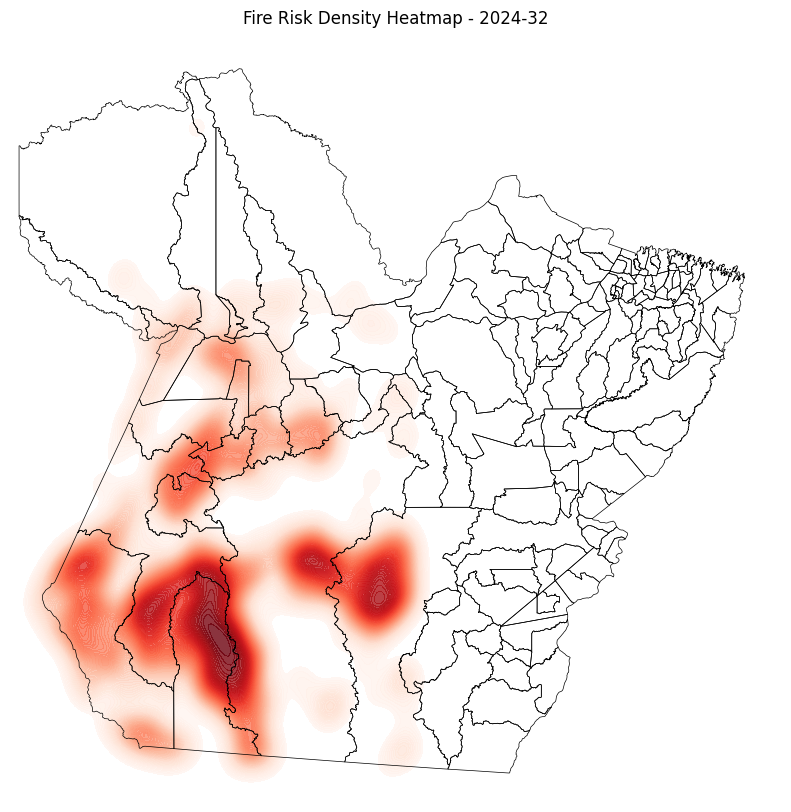

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))

# KDE plot using longitude and latitude
sns.kdeplot(
    data=high_risk_df,
    x='longitude',
    y='latitude',
    fill=True,
    cmap='Reds',
    bw_adjust=0.4,
    thresh=0.02,
    levels=100,
    alpha=0.8,
    ax=ax
)

# Overlay municipality boundaries
para_gdf.boundary.plot(ax=ax, linewidth=0.5, color='black')
ax.set_title(f"Fire Risk Density Heatmap - {week_of_interest}")
ax.axis('off')
plt.show()


In [ ]:
pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 81.8 MB/s eta 0:00:00


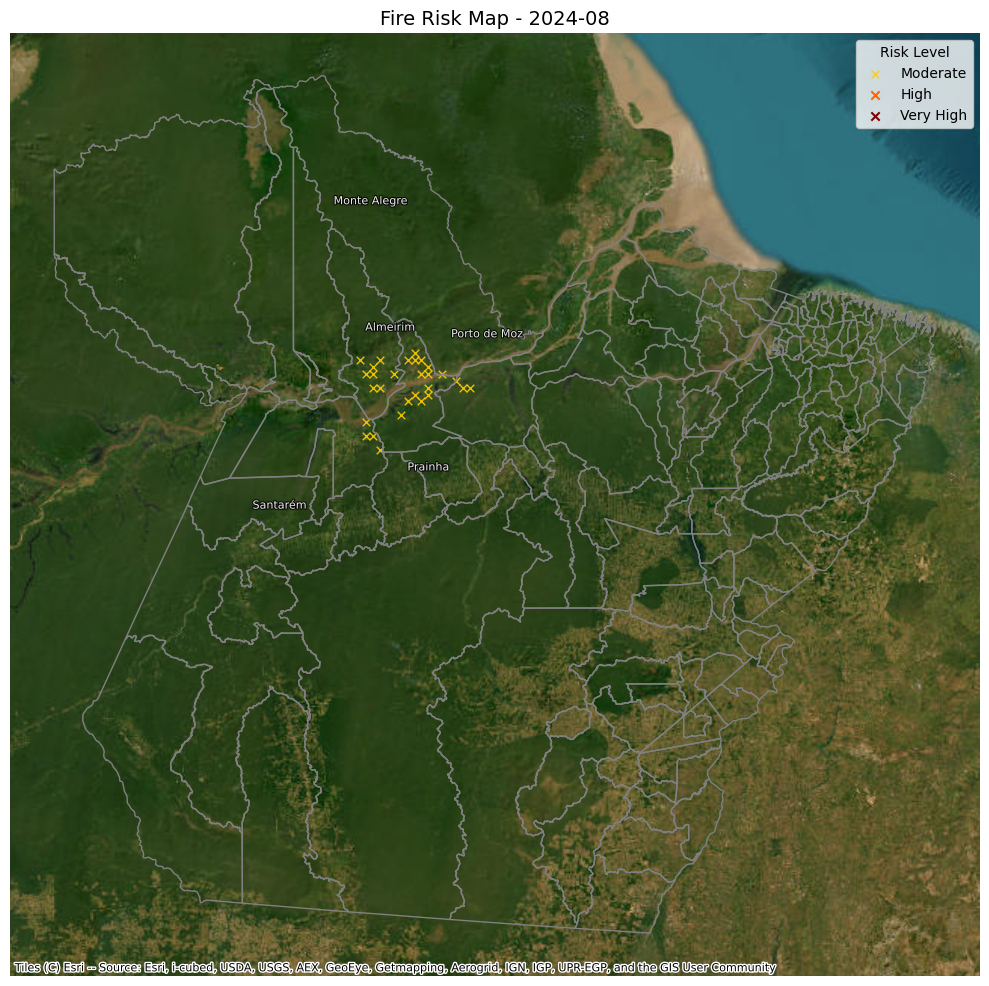

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point
import matplotlib.patheffects as path_effects
import numpy as np


# Filter relevant risk levels and drop missing coordinates
high_risk_df = week_df[
    week_df['risk_level'].isin(['Moderate', 'High', 'Very High'])
].dropna(subset=['longitude', 'latitude'])


# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(high_risk_df['longitude'], high_risk_df['latitude'])]
high_risk_gdf = gpd.GeoDataFrame(high_risk_df, geometry=geometry, crs='EPSG:4326')


# Reproject both to Web Mercator for contextily compatibility
high_risk_gdf = high_risk_gdf.to_crs(epsg=3857)
para_gdf_proj = para_gdf.to_crs(epsg=3857)

# Spatial join: attach municipality info to each fire point
joined = gpd.sjoin(high_risk_gdf, para_gdf_proj, how='inner', predicate='within')

# Get only municipalities that contain at least one high-risk point
municipalities_with_alerts = para_gdf_proj[para_gdf_proj.index.isin(joined['index_right'].unique())]


# Start plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot municipality boundaries (without fill)
para_gdf_proj.boundary.plot(ax=ax, linewidth=1, color='grey')

# Add satellite basemap
ctx.add_basemap(ax, crs=para_gdf_proj.crs, source=ctx.providers.Esri.WorldImagery)
#ctx.add_basemap(ax, crs=para_gdf_proj.crs, source=ctx.providers.CartoDB.Positron)


# Plot fire risk points with cross markers
all_levels = ['Moderate', 'High', 'Very High']
colors = {'Moderate': '#ffcc00', 'High': '#ff6600', 'Very High': '#800000'}

# Plot actual points
for level in all_levels:
    if level in high_risk_gdf['risk_level'].unique():
        group = high_risk_gdf[high_risk_gdf['risk_level'] == level]
        group.plot(
            ax=ax,
            markersize=30,
            marker='x',
            color=colors[level],
            label=level,
            alpha=0.9,
            linewidth=1
        )
    else:
        # Plot invisible dummy point to force it into the legend
        ax.scatter([], [], color=colors[level], marker='x', label=level)

# Label only municipalities that have alerts, with slight jitter to avoid overlaps
for idx, row in municipalities_with_alerts.iterrows():
    if row['geometry'].is_empty:
        continue
    rep_point = row['geometry'].representative_point()

    # Add slight random jitter to avoid overlap
    jitter_x = np.random.uniform(-2000, 2000)  # in Web Mercator units (meters)
    jitter_y = np.random.uniform(-200000, 200000)

    ax.text(
        rep_point.x + jitter_x, rep_point.y + jitter_y, row['name'],
        fontsize=8, ha='center', color='white', alpha=0.9,
        path_effects=[
            path_effects.Stroke(linewidth=1.5, foreground='black'),
            path_effects.Normal()
        ]
    )

# Final plot settings
ax.set_title(f"Fire Risk Map - {week_of_interest}", fontsize=14)
ax.legend(title="Risk Level")
ax.set_axis_off()
plt.tight_layout()
# Save the plot
plt.savefig("fire_risk_map04.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
# --- Summary Table per Municipality ---

# Work with high/moderate/very high risk alerts only
high_risk_summary = high_risk.copy()

# Group by municipality name
summary_table = high_risk_summary.groupby('name').agg(
    num_alerts=('risk_level', 'count'),
    avg_risk_prob=('fire_risk_prob', 'mean'),
    max_risk_prob=('fire_risk_prob', 'max'),
    most_common_level=('risk_level', lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
).reset_index()

# Sort by highest average risk probability
summary_table = summary_table.sort_values(by='num_alerts', ascending=False)

# Format probabilities to 2 decimals
summary_table['avg_risk_prob'] = summary_table['avg_risk_prob'].round(2)
summary_table['max_risk_prob'] = summary_table['max_risk_prob'].round(2)

# Display top 10 municipalities at risk (you can adjust or export full table)
print(f"          Fire Risk Summary Table for Week {week_of_interest}\n")
summary_table

          Fire Risk Summary Table for Week 2024-08



,name,num_alerts,avg_risk_prob,max_risk_prob,most_common_level
3,Prainha,13,0.49,0.59,Moderate
1,Monte Alegre,8,0.47,0.53,Moderate
4,Santarém,4,0.49,0.49,Moderate
2,Porto de Moz,3,0.49,0.49,Moderate
0,Almeirim,1,0.43,0.43,Moderate


In [ ]:
print(para_gdf.columns)


Index(['id', 'name', 'description', 'geometry'], dtype='object')


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Select top N highest-risk alert points (adjust N as needed)
top_locations = high_risk.sort_values(by='fire_risk_prob', ascending=False).head(10)

# Create GeoDataFrame for top-risk locations
geometry = [Point(xy) for xy in zip(top_locations['longitude'], top_locations['latitude'])]
top_locations_gdf = gpd.GeoDataFrame(top_locations, geometry=geometry, crs=para_gdf.crs)

# Clean any unwanted index columns
top_locations_gdf = top_locations_gdf.drop(columns=['index_right'], errors='ignore')

# Confirm para_gdf has the needed columns
assert 'name' in para_gdf.columns and 'geometry' in para_gdf.columns, "Missing required columns in para_gdf"

# Spatial join with municipalities
top_locations_joined = gpd.sjoin(top_locations_gdf, para_gdf[['name', 'geometry']], how='left', predicate='within')

# Final table
top_locations_table = top_locations_joined[[
    'latitude', 'longitude', 'fire_risk_prob', 'risk_level', 'name_right'
]].copy()

# Round and rename for display
top_locations_table['fire_risk_prob'] = top_locations_table['fire_risk_prob'].round(3)
top_locations_table.columns = ['Latitude', 'Longitude', 'Fire Risk Probability', 'Risk Level', 'Municipality']

# Reset index
top_locations_table = top_locations_table.reset_index(drop=True)

# Filter relevant risk levels
top_risky_locations = top_locations_table[
    top_locations_table['Risk Level'].isin(['Moderate', 'High', 'Very High'])
]

# Display table
print(f"\n           Top Exact Fire Risk Locations (Week {week_of_interest})\n")
display(top_risky_locations)




           Top Exact Fire Risk Locations (Week 2024-08)



,Latitude,Longitude,Fire Risk Probability,Risk Level,Municipality
0,-2.05,-53.45,0.586,Moderate,Prainha
1,-1.75,-53.55,0.531,Moderate,Prainha
2,-1.55,-54.15,0.531,Moderate,Monte Alegre
3,-1.55,-53.75,0.490,Moderate,Prainha
4,-1.95,-52.85,0.490,Moderate,Porto de Moz
5,-2.15,-53.75,0.490,Moderate,Prainha
6,-1.95,-54.15,0.490,Moderate,Monte Alegre
7,-1.95,-54.25,0.490,Moderate,Monte Alegre
8,-2.45,-54.35,0.490,Moderate,Santarém
9,-2.15,-53.55,0.489,Moderate,Prainha


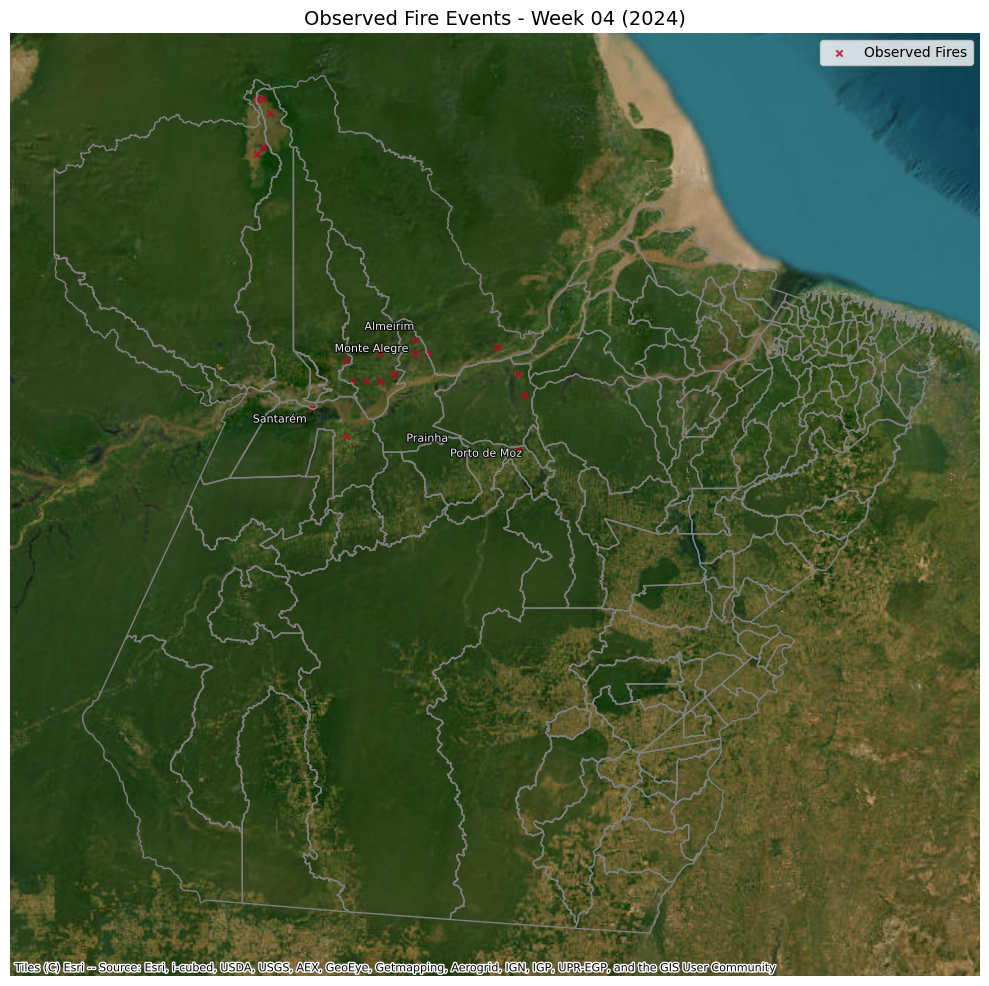

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# --- Step 1: Filter fires for the week of interest and where fire actually occurred ---
fires_week_df = df[(df['year_week'] == '2024-04') & (df['fire_label'] == 1)].copy()

# --- Step 2: Create GeoDataFrame from coordinates ---
geometry = [Point(xy) for xy in zip(fires_week_df['longitude'], fires_week_df['latitude'])]
fires_gdf = gpd.GeoDataFrame(fires_week_df, geometry=geometry, crs='EPSG:4326')
fires_gdf = fires_gdf.to_crs(epsg=3857)

# --- Step 3: Reproject municipality boundaries ---
para_gdf_proj = para_gdf.to_crs(epsg=3857)

# --- Step 4: Plot ---
fig, ax = plt.subplots(figsize=(10, 10))

# Plot boundaries
para_gdf_proj.boundary.plot(ax=ax, linewidth=1, color='grey')

# Basemap
ctx.add_basemap(ax, crs=para_gdf_proj.crs, source=ctx.providers.Esri.WorldImagery)

# Actual fire points
fires_gdf.plot(
    ax=ax,
    color='#bd0026',
    markersize=20,
    marker='x',
    label='Observed Fires',
    alpha=0.8
)

# Label only municipalities that have alerts, with slight jitter to avoid overlaps
for idx, row in municipalities_with_alerts.iterrows():
    if row['geometry'].is_empty:
        continue
    rep_point = row['geometry'].representative_point()

    # Add slight random jitter to avoid overlap
    jitter_x = np.random.uniform(-2000, 2000)  # in Web Mercator units (meters)
    jitter_y = np.random.uniform(-200000, 200000)

    ax.text(
        rep_point.x + jitter_x, rep_point.y + jitter_y, row['name'],
        fontsize=8, ha='center', color='white', alpha=0.9,
        path_effects=[
            path_effects.Stroke(linewidth=1.5, foreground='black'),
            path_effects.Normal()
        ]
    )
# Title and legend
ax.set_title("Observed Fire Events - Week 04 (2024)", fontsize=14)
ax.legend()
ax.set_axis_off()
plt.tight_layout()

# Save and show
plt.savefig("observed_fires_week04.png", dpi=300, bbox_inches='tight')
plt.show()